In [1]:
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import geopandas as gpd

In [3]:
import statsmodels.api as sm
import networkx as nx
from pyvis.network import Network


In [4]:
map_df = gpd.read_file('LAD_APR_2019_UK_BUC.shp')

In [5]:
keep = ["E"]
map_df = map_df[map_df['LAD19CD'].str.contains('|'.join(keep))]
map_df

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53..."
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51..."
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52..."
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51..."
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51..."
...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16..."
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18..."
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19..."
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17..."


In [8]:
map_df['Centroid'] = map_df['geometry'].centroid

In [6]:
cities_df = gpd.read_file('TCITY_2015_EW_BGG_V2.shp')

In [89]:
cities_df.head(20)

,TCITY15CD,TCITY15NM,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,J01000001,Barnsley,436375,407875,-1.452250,53.5662,b8f30b00-7b1b-40f9-aa0f-8336ec877f55,"POLYGON ((432250.004 411199.994, 432300.002 41..."
1,J01000002,Basildon,572525,189350,0.488409,51.5766,f1232e18-8e80-488e-a6e4-f7ce988993ba,"MULTIPOLYGON (((571200.003 191099.997, 571200...."
2,J01000003,Basingstoke,463725,152600,-1.087930,51.2690,e54ea899-ecd0-43a8-9249-3f42d005c8d7,"POLYGON ((466600.000 155200.004, 466550.002 15..."
3,J01000004,Bath,374800,164325,-2.363450,51.3774,db04cdf4-2fa4-4af4-9ffb-8e7f5afcaa0a,"MULTIPOLYGON (((378699.998 166450.003, 378699...."
4,J01000005,Bedford,505925,250450,-0.453520,52.1422,9829a7ac-85ca-40fb-9bf1-a0f325648505,"MULTIPOLYGON (((507750.004 252099.996, 507750...."
5,J01000006,Birkenhead,330350,388175,-3.048650,53.3858,a7cd1c62-3dd3-469f-9d17-3d57ed24bc5f,"POLYGON ((328000.004 388250.004, 328000.004 38..."
6,J01000007,Birmingham,408850,286925,-1.871110,52.4802,a7758bc7-37e2-4b62-a1a2-7c0f7d18ce02,"MULTIPOLYGON (((416700.000 291749.997, 416700...."
7,J01000008,Blackburn,367900,427350,-2.488160,53.7416,c522cd8a-812a-4b5e-aaa4-1f6236bd2d4f,"POLYGON ((364999.996 424799.992, 364949.998 42..."
8,J01000009,Blackpool,332725,433075,-3.022640,53.7896,6b85fa3a-6dfb-4399-ae4f-e0f187c80513,"MULTIPOLYGON (((333150.001 438900.005, 333150...."
9,J01000010,Bolton,372325,411150,-2.419620,53.5962,d9a38615-3158-4f6a-b133-66fdbc5c9f4c,"MULTIPOLYGON (((367499.997 408249.999, 367499...."


In [72]:
map_df

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756)
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770)
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737)
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696)
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470)
...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121)
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072)
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653)
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545)


In [266]:
city_test = [(map_df['Centroid'].iloc[313]).within(cities_df['geometry'].iloc[i]) for i in range(len(cities_df))]

In [267]:
city_test

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False]

In [94]:
def city_check(df1, df2):

    for i in range(len(df1)):
        for j in range(len(df2)):
            city = df1.geometry.iloc[i].overlaps(df2.geometry.iloc[j])
    return city

In [95]:
test3 = city_check(cities_df, map_df)

In [97]:
test3

False

In [275]:
citycheck = [(map_df['Centroid'].iloc[i]).within(cities_df.geometry) for i in range(len(map_df))]

In [276]:
citycheck_list = [citycheck[i].any() for i in range(len(citycheck))]

In [277]:
citycheck_list = list(citycheck_list)

In [278]:
map_df['Urban/Rural'] = citycheck_list

In [279]:
map_df['Urban/Rural'] = map_df['Urban/Rural'].replace([True, False], ['Urban', 'Rural'])

In [280]:
map_df

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,Urban/Rural
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Rural
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Urban
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Rural
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Urban
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Urban
...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Urban
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Urban
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Urban
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Urban


In [47]:
map_df.iloc[8]

LAD19CD                                             E06000009
LAD19NM                                             Blackpool
LAD19NMW                                                  NaN
BNG_E                                                  332763
BNG_N                                                  436633
LONG                                                 -3.02284
LAT                                                   53.8216
GlobalID                 0ab97f3f-1b1b-4eff-aaf5-ba4e9c93c068
geometry    POLYGON ((331199.2017999999 442677.8043000009,...
Centroid         POINT (332478.7622268364 436130.96284296364)
Name: 8, dtype: object

In [282]:
fw_corrs = pd.read_csv('First_Wave_Corrs.csv')

In [524]:
fwr_corrs = pd.read_csv('First_Wave_R.csv')

In [284]:
ltla_dist = pd.read_csv('thirdwave_r_wdistances.csv')


In [285]:
ltla_distances = list(ltla_dist['Distance between centroids'])

In [525]:
fwr_corrs = fwr_corrs.loc[fwr_corrs['LTLA 1'] != 'Hackney and City of London']
fwr_corrs = fwr_corrs.loc[fwr_corrs['LTLA 2'] != 'Hackney and City of London']
fwr_corrs

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.720792,7.0
1,Redcar and Cleveland,Havant,0.684387,2.0
2,Redcar and Cleveland,Surrey Heath,0.750170,-3.0
3,Redcar and Cleveland,Worthing,0.701347,-5.0
4,Redcar and Cleveland,Bolton,0.675584,-17.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.603410,-3.0
49451,Basingstoke and Deane,Hillingdon,0.526178,-46.0
49452,Tunbridge Wells,Rushcliffe,0.673384,1.0
49453,Tunbridge Wells,Hillingdon,0.427123,-31.0


In [287]:
fw_corrs = fw_corrs.loc[fw_corrs['LTLA 1'] != 'Hackney and City of London']
fw_corrs = fw_corrs.loc[fw_corrs['LTLA 2'] != 'Hackney and City of London']


In [288]:
fwr_corrs['Distance between centroids'] = ltla_distances


In [289]:
fw_corrs['Distance between centroids'] = ltla_distances

In [526]:
fwr_corrs['LTLA 1'] = fwr_corrs['LTLA 1'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])
fwr_corrs['LTLA 2'] = fwr_corrs['LTLA 2'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])


In [291]:
fw_corrs['LTLA 1'] = fw_corrs['LTLA 1'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])
fw_corrs['LTLA 2'] = fw_corrs['LTLA 2'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])
fw_corrs

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids
0,Redcar and Cleveland,East Devon,0.597890,5.5,446.686187
1,Redcar and Cleveland,Havant,0.705012,-6.5,411.943769
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.5,357.783404
3,Redcar and Cleveland,Worthing,0.618926,-6.5,416.062959
4,Redcar and Cleveland,Bolton,0.696269,8.5,143.901356
...,...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.476345,5.5,181.384385
49451,Basingstoke and Deane,Hillingdon,0.750190,-3.5,60.445984
49452,Tunbridge Wells,Rushcliffe,0.382597,-7.5,222.863872
49453,Tunbridge Wells,Hillingdon,0.413961,-47.5,77.442951


In [292]:
rural_urban = map_df.drop(columns = ['LAD19CD', 'LAD19NMW', 'BNG_E', 'BNG_N', 'LONG', 'LAT', 'GlobalID', 'geometry', 'Centroid'])

In [527]:
fwr_corrs = fwr_corrs.merge(rural_urban, how='left', left_on='LTLA 1', right_on = 'LAD19NM')
fwr_corrs = fwr_corrs.merge(rural_urban, how='left', left_on='LTLA 2', right_on = 'LAD19NM')


In [531]:
fwr_corrs['Urban/Rural'] = urbanrural
fwr_corrs['Distance > 150km?'] = distancecheck

In [529]:
fwr_corrs = fwr_corrs.drop(columns=['LAD19NM_x', 'LAD19NM_y', 'Urban/Rural_x', 'Urban/Rural_y'])


In [532]:
fwr_corrs['Distance between centroids'] = list(fw_corrs['Distance between centroids'])

In [294]:
fw_corrs = fw_corrs.merge(rural_urban, how='left', left_on='LTLA 1', right_on = 'LAD19NM')
fw_corrs = fw_corrs.merge(rural_urban, how='left', left_on='LTLA 2', right_on = 'LAD19NM')


In [295]:
fw_corrs["Urban/Rural"] = fw_corrs['Urban/Rural_x'].astype(str) +"-"+ fw_corrs["Urban/Rural_y"]


In [296]:
fw_corrs['Urban/Rural'] = fw_corrs['Urban/Rural'].replace(['Rural-Urban'], ['Urban-Rural'])

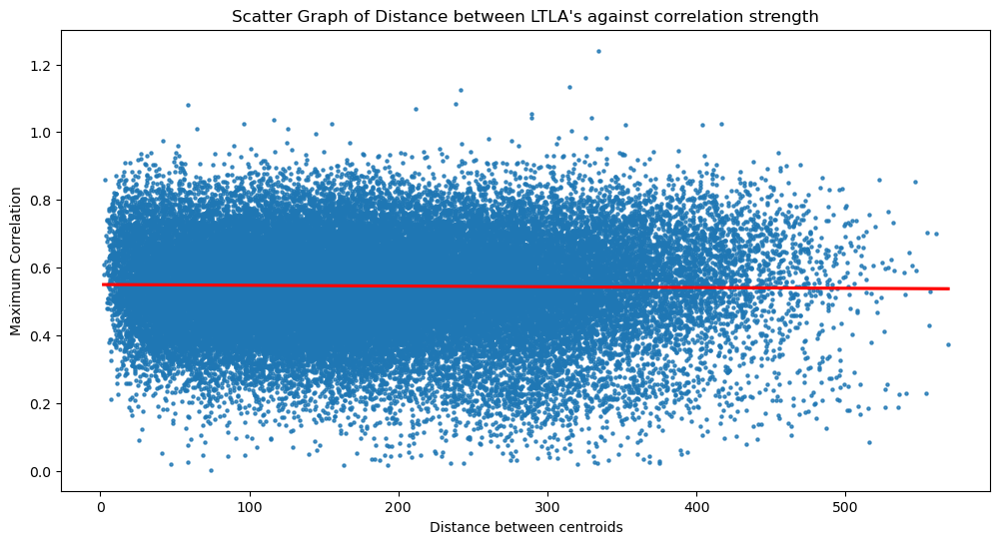

In [297]:
plt.figure(figsize=(12,6))

sns.regplot(data = fwr_corrs, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

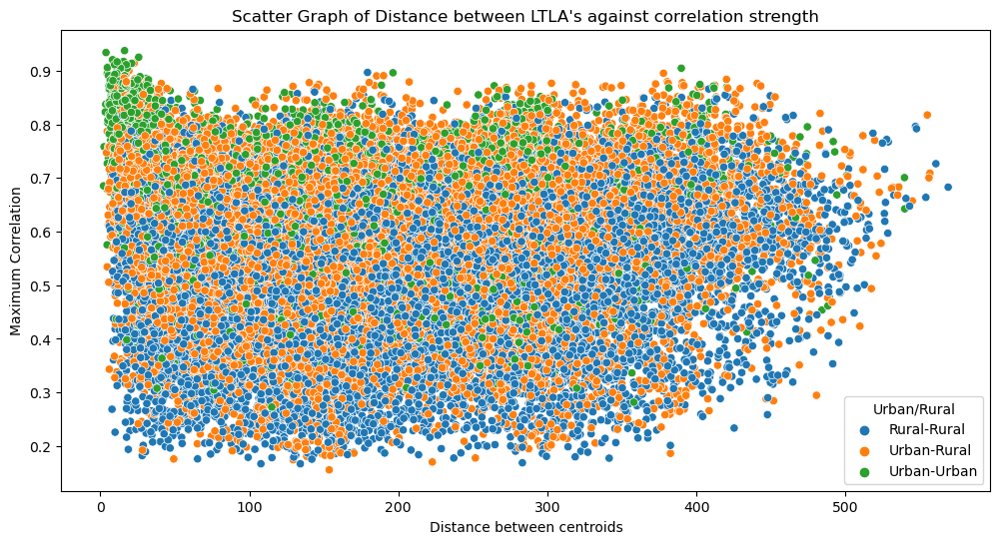

In [298]:
plt.figure(figsize=(12,6))

sns.scatterplot(data = fw_corrs, x = "Distance between centroids", y = "Maximum Correlation", hue = 'Urban/Rural')
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [299]:
urban_urban = fw_corrs.loc[fw_corrs['Urban/Rural'] == 'Urban-Urban']
urban_rural = fw_corrs.loc[fw_corrs['Urban/Rural'] == 'Urban-Rural']
rural_rural = fw_corrs.loc[fw_corrs['Urban/Rural'] == 'Rural-Rural']

In [300]:
from scipy.stats import pearsonr
data1 = urban_urban['Distance between centroids']
data2 = urban_urban['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Urban-Urban Correlation: %.3f' % corr)

data3 = urban_rural['Distance between centroids']
data4 = urban_rural['Maximum Correlation']

corr, _ = pearsonr(data3, data4)
print('Urban-Rural Correlation: %.3f' % corr)

data5 = rural_rural['Distance between centroids']
data6 = rural_rural['Maximum Correlation']

corr, _ = pearsonr(data5, data6)
print('Rural-Rural Correlation: %.3f' % corr)

Urban-Urban Correlation: -0.082
Urban-Rural Correlation: 0.010
Rural-Rural Correlation: 0.049


In [301]:
strong_urban = urban_urban.loc[(urban_urban['Maximum Correlation'] > 0.85) & (urban_urban['Distance between centroids'] > 100)]

In [302]:
strong_urban.head(20)

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids,LAD19NM_x,Urban/Rural_x,LAD19NM_y,Urban/Rural_y,Urban/Rural
3328,Hounslow,Birmingham,0.854030,-1.5,153.742082,Hounslow,Urban,Birmingham,Urban,Urban-Urban
7347,Reading,Liverpool,0.855259,0.5,253.659654,Reading,Urban,Liverpool,Urban,Urban-Urban
10182,Newcastle upon Tyne,Liverpool,0.896466,0.5,196.349024,Newcastle upon Tyne,Urban,Liverpool,Urban,Urban-Urban
10300,Newcastle upon Tyne,Birmingham,0.860675,0.5,280.571163,Newcastle upon Tyne,Urban,Birmingham,Urban,Urban-Urban
10314,Newcastle upon Tyne,Bromley,0.869840,-1.5,420.273108,Newcastle upon Tyne,Urban,Bromley,Urban,Urban-Urban
10339,Newcastle upon Tyne,Ealing,0.856553,-7.5,397.695268,Newcastle upon Tyne,Urban,Ealing,Urban,Urban-Urban
10772,Stoke-on-Trent,York,0.856315,9.5,127.661143,Stoke-on-Trent,Urban,York,Urban,Urban-Urban
13196,Knowsley,Enfield,0.851420,-6.5,271.121680,Knowsley,Urban,Enfield,Urban,Urban-Urban
13303,Knowsley,Birmingham,0.852006,-6.5,122.371177,Knowsley,Urban,Birmingham,Urban,Urban-Urban
13318,Knowsley,Harrow,0.872265,-7.5,264.303948,Knowsley,Urban,Harrow,Urban,Urban-Urban


In [303]:
urban_urban.describe()

,Maximum Correlation,Lag in Days,Distance between centroids
count,4278.000000,4278.000000,4278.000000
mean,0.663511,0.429874,163.583224
std,0.118182,14.464528,107.924551
min,0.272730,-83.500000,2.246661
25%,0.591791,-6.500000,71.423925
50%,0.682875,-0.500000,151.962697
75%,0.746758,6.500000,248.112136
max,0.937753,79.500000,539.659494


In [177]:
urban_rural.describe()

,Maximum Correlation,Lag in Days,Distance between centroids
count,20680.000000,20680.000000,20680.000000
mean,0.561229,0.072389,193.594853
std,0.124647,15.971549,106.120344
min,0.166707,-113.500000,3.697989
25%,0.482104,-7.500000,109.810614
50%,0.570428,-0.500000,180.350938
75%,0.648442,7.500000,268.188011
max,0.937753,114.500000,560.557826


In [178]:
rural_rural.describe()

,Maximum Correlation,Lag in Days,Distance between centroids
count,4371.000000,4371.000000,4371.000000
mean,0.543290,1.267330,212.600073
std,0.118810,14.630337,114.943569
min,0.182645,-98.500000,3.377011
25%,0.466535,-7.500000,118.767850
50%,0.547379,-0.500000,198.048895
75%,0.624534,9.500000,297.622602
max,0.867612,95.500000,568.808378


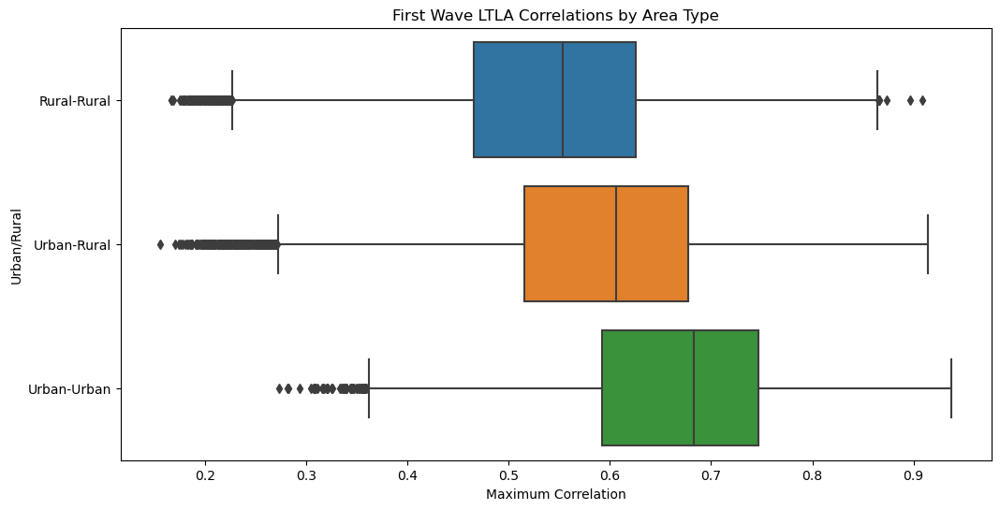

In [304]:
plt.figure(figsize=(12,6))
sns.boxplot(x=fw_corrs["Maximum Correlation"], y= fw_corrs['Urban/Rural'])
plt.title('First Wave LTLA Correlations by Area Type')
plt.show()

In [305]:
lag_test = abs(fw_corrs['Lag in Days'])

In [306]:
fw_corrs['Absolute Lag Value'] = list(lag_test) 

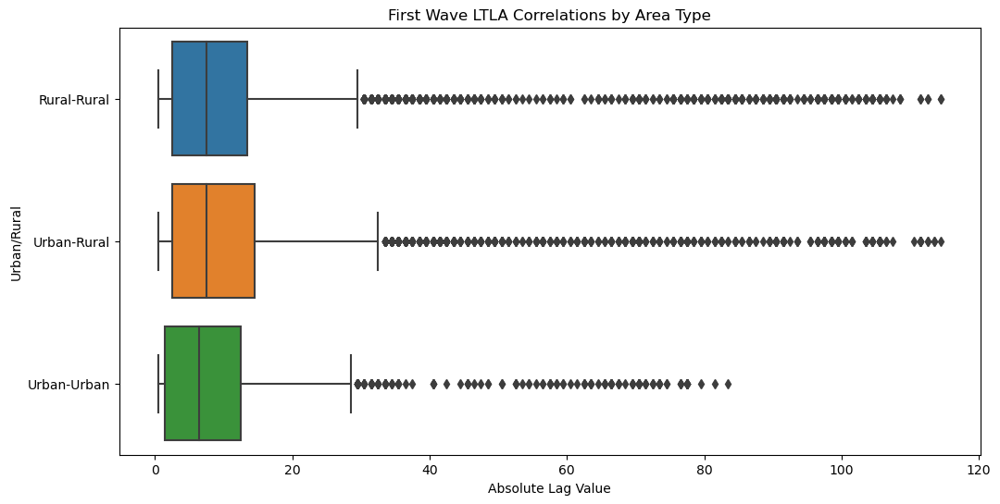

In [307]:
plt.figure(figsize=(12,6))
sns.boxplot(x=fw_corrs["Absolute Lag Value"], y= fw_corrs['Urban/Rural'])
plt.title('First Wave LTLA Correlations by Area Type')
plt.show()

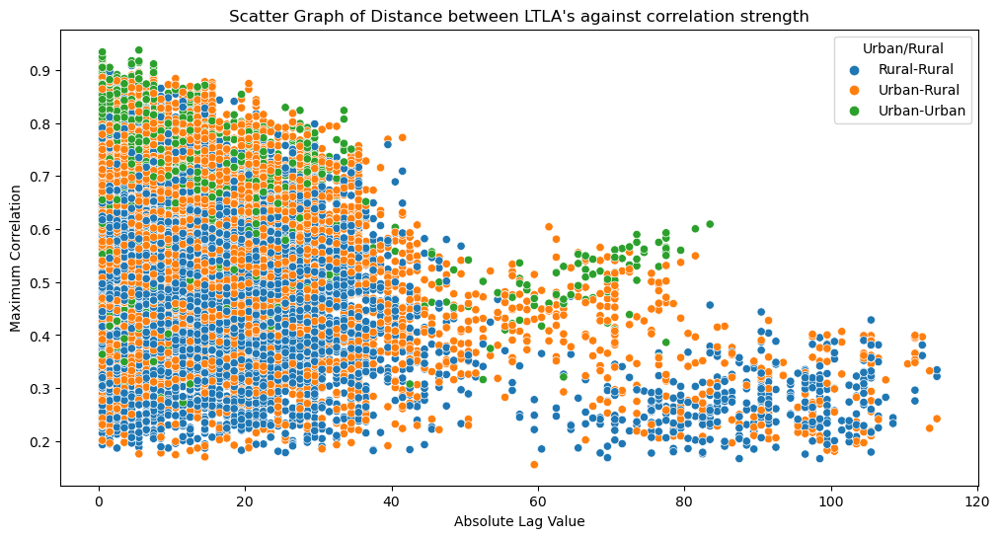

In [308]:
plt.figure(figsize=(12,6))

sns.scatterplot(data = fw_corrs, x = "Absolute Lag Value", y = "Maximum Correlation", hue = 'Urban/Rural')
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [309]:
data1 = fw_corrs['Absolute Lag Value']
data2 = fw_corrs['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Correlation: %.3f' % corr)

Correlation: -0.292


In [310]:
distancecheck = [fw_corrs['Distance between centroids'].iloc[i] > 150 for i in range(len(fw_corrs))]

In [311]:
fw_corrs['Distance > 150km?'] = distancecheck

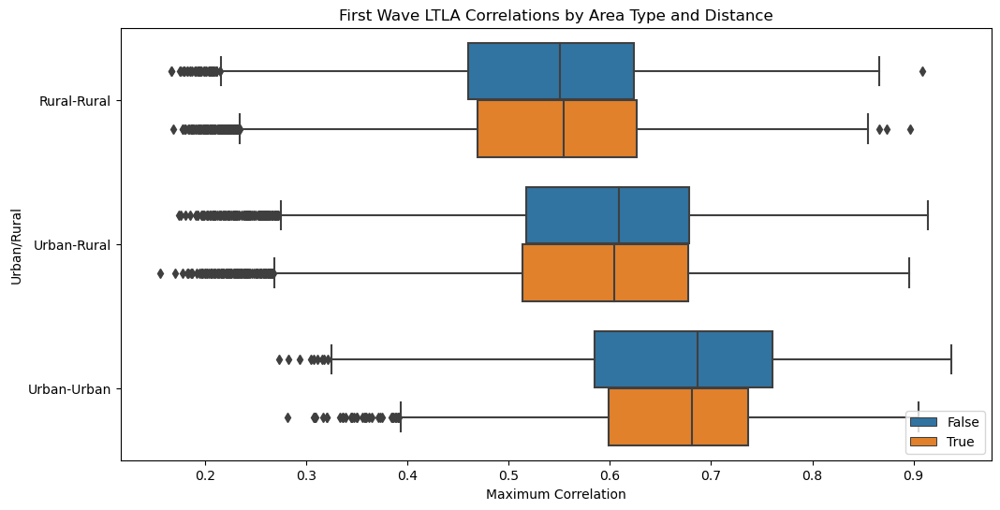

In [312]:
plt.figure(figsize=(12,6))
sns.boxplot(x=fw_corrs["Maximum Correlation"], y= fw_corrs['Urban/Rural'], hue = fw_corrs['Distance > 150km?'])
plt.title('First Wave LTLA Correlations by Area Type and Distance')
plt.legend(loc='lower right')
plt.show()

In [313]:
sw_corrs = pd.read_csv('Second_Wave_Corrs.csv')

In [314]:
sw_corrs

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.693965,0.0
1,Redcar and Cleveland,Havant,0.611459,0.0
2,Redcar and Cleveland,Surrey Heath,0.565359,0.0
3,Redcar and Cleveland,Worthing,0.601492,0.0
4,Redcar and Cleveland,Bolton,0.724827,0.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.553512,0.0
49451,Basingstoke and Deane,Hillingdon,0.913231,0.0
49452,Tunbridge Wells,Rushcliffe,0.440782,0.0
49453,Tunbridge Wells,Hillingdon,0.922426,0.0


In [315]:
urbanrural = list(fw_corrs['Urban/Rural'])

In [316]:
sw_corrs = sw_corrs.loc[sw_corrs['LTLA 1'] != 'Hackney and City of London']
sw_corrs = sw_corrs.loc[sw_corrs['LTLA 2'] != 'Hackney and City of London']

In [317]:
sw_corrs['LTLA 1'] = sw_corrs['LTLA 1'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])
sw_corrs['LTLA 2'] = sw_corrs['LTLA 2'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])

In [318]:
sw_corrs['Urban/Rural'] = urbanrural
sw_corrs['Distance > 150km?'] = distancecheck

In [319]:
sw_corrs['Distance between centroids'] = list(fwr_corrs['Distance between centroids'])

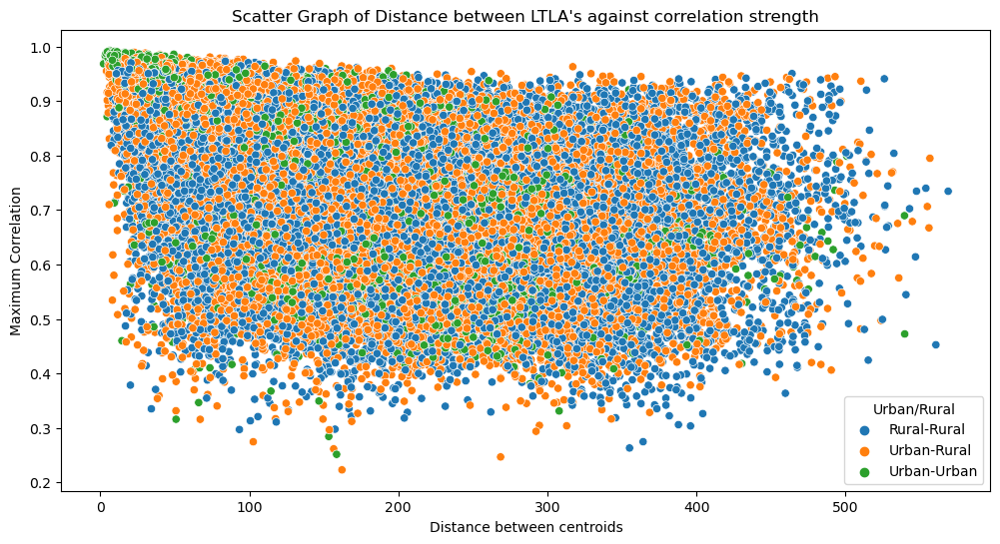

In [320]:
plt.figure(figsize=(12,6))

sns.scatterplot(data = sw_corrs, x = "Distance between centroids", y = "Maximum Correlation", hue = 'Urban/Rural')
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [321]:
urban_urban2 = sw_corrs.loc[sw_corrs['Urban/Rural'] == 'Urban-Urban']
urban_rural2 = sw_corrs.loc[sw_corrs['Urban/Rural'] == 'Urban-Rural']
rural_rural2 = sw_corrs.loc[sw_corrs['Urban/Rural'] == 'Rural-Rural']

In [322]:
data1 = urban_urban2['Distance between centroids']
data2 = urban_urban2['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Urban-Urban Correlation: %.3f' % corr)

data3 = urban_rural2['Distance between centroids']
data4 = urban_rural2['Maximum Correlation']

corr, _ = pearsonr(data3, data4)
print('Urban-Rural Correlation: %.3f' % corr)

data5 = rural_rural2['Distance between centroids']
data6 = rural_rural2['Maximum Correlation']

corr, _ = pearsonr(data5, data6)
print('Rural-Rural Correlation: %.3f' % corr)

Urban-Urban Correlation: -0.674
Urban-Rural Correlation: -0.485
Rural-Rural Correlation: -0.365


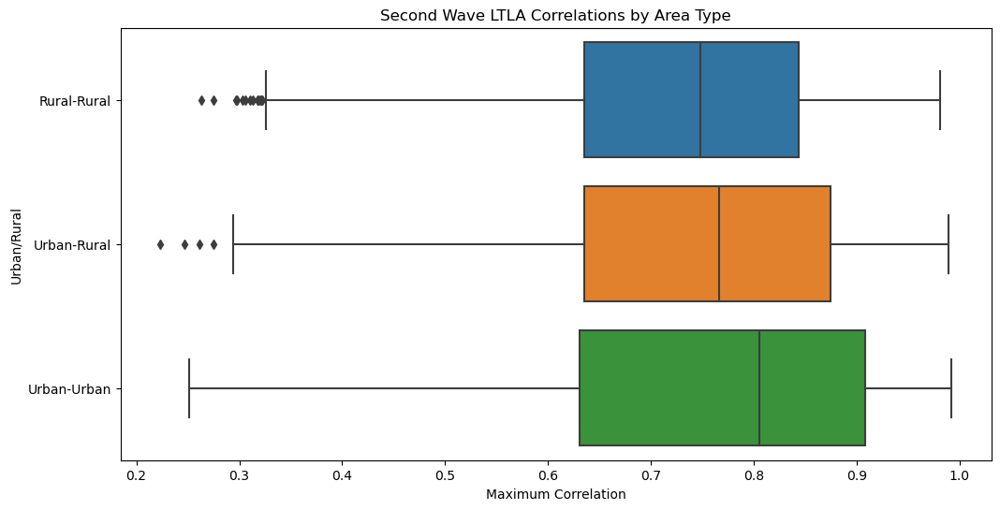

In [323]:
plt.figure(figsize=(12,6))
sns.boxplot(x=sw_corrs["Maximum Correlation"], y= sw_corrs['Urban/Rural'])
plt.title('Second Wave LTLA Correlations by Area Type')
plt.show()

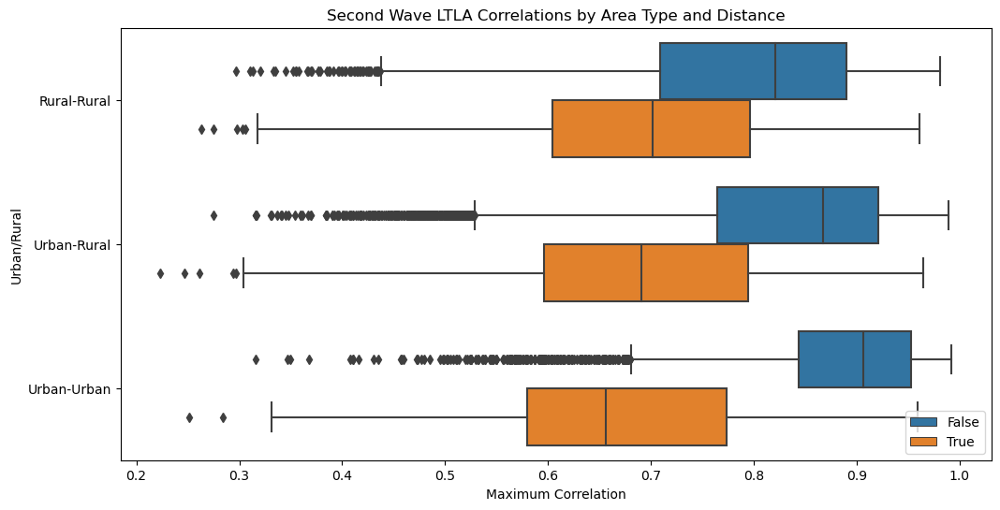

In [324]:
plt.figure(figsize=(12,6))
sns.boxplot(x=sw_corrs["Maximum Correlation"], y= sw_corrs['Urban/Rural'], hue = sw_corrs['Distance > 150km?'])
plt.title('Second Wave LTLA Correlations by Area Type and Distance')
plt.legend(loc='lower right')
plt.show()

In [325]:
rsw_corrs = pd.read_csv('Second_Wave_R.csv')

In [326]:
rsw_corrs = rsw_corrs.loc[rsw_corrs['LTLA 1'] != 'Hackney and City of London']
rsw_corrs = rsw_corrs.loc[rsw_corrs['LTLA 2'] != 'Hackney and City of London']

In [327]:
rsw_corrs['LTLA 1'] = rsw_corrs['LTLA 1'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])
rsw_corrs['LTLA 2'] = rsw_corrs['LTLA 2'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])

In [328]:
rsw_corrs['Urban/Rural'] = urbanrural
rsw_corrs['Distance > 150km?'] = distancecheck

In [329]:
rsw_corrs['Distance between centroids'] = list(fwr_corrs['Distance between centroids'])

In [330]:
urban_urban2r = rsw_corrs.loc[rsw_corrs['Urban/Rural'] == 'Urban-Urban']
urban_rural2r = rsw_corrs.loc[rsw_corrs['Urban/Rural'] == 'Urban-Rural']
rural_rural2r = rsw_corrs.loc[rsw_corrs['Urban/Rural'] == 'Rural-Rural']

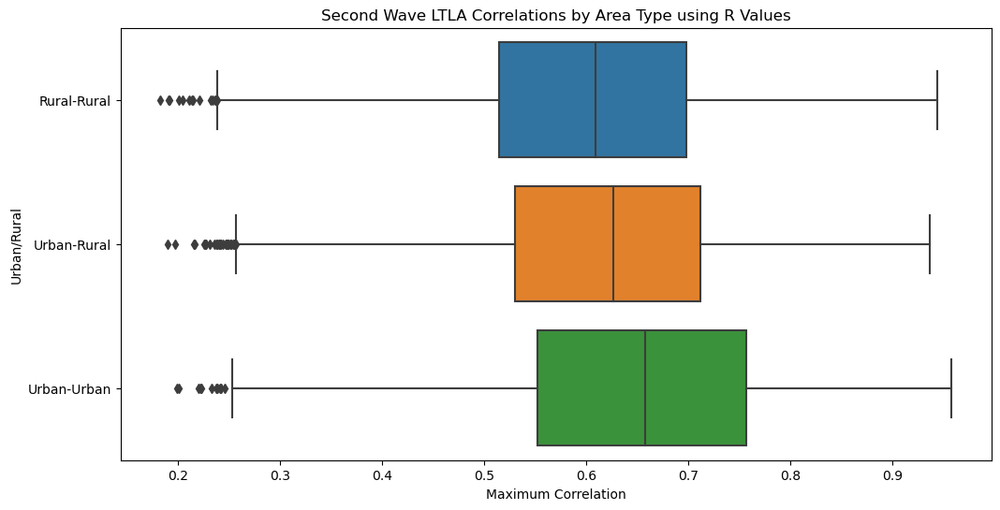

In [331]:
plt.figure(figsize=(12,6))
sns.boxplot(x=rsw_corrs["Maximum Correlation"], y= rsw_corrs['Urban/Rural'])
plt.title('Second Wave LTLA Correlations by Area Type using R Values')
plt.show()

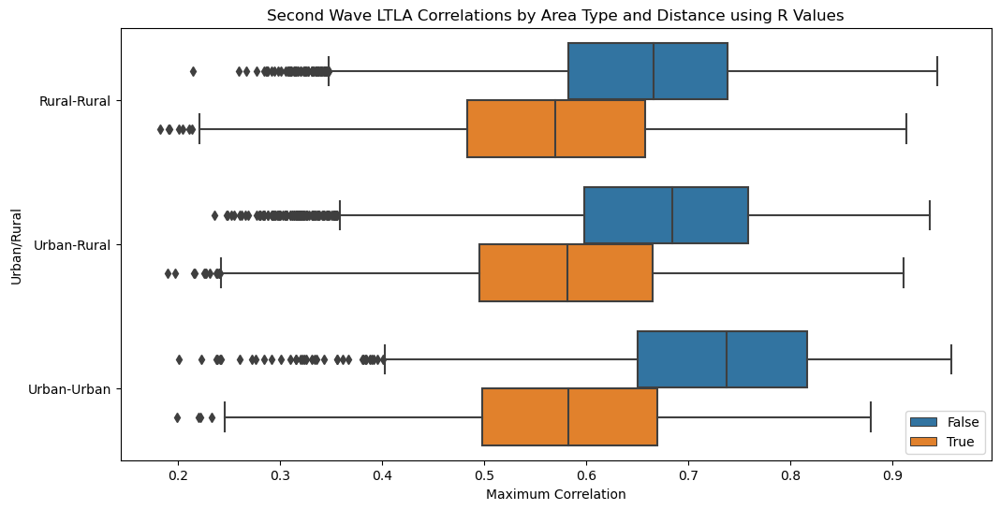

In [332]:
plt.figure(figsize=(12,6))
sns.boxplot(x=rsw_corrs["Maximum Correlation"], y= rsw_corrs['Urban/Rural'], hue = rsw_corrs['Distance > 150km?'])
plt.title('Second Wave LTLA Correlations by Area Type and Distance using R Values')
plt.legend(loc='lower right')
plt.show()

In [333]:
tw_corrs = pd.read_csv('Third_Wave_Corrs.csv')

In [334]:
tw_corrs = tw_corrs.loc[tw_corrs['LTLA 1'] != 'Hackney and City of London']
tw_corrs = tw_corrs.loc[tw_corrs['LTLA 2'] != 'Hackney and City of London']

In [335]:
tw_corrs['LTLA 1'] = tw_corrs['LTLA 1'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])
tw_corrs['LTLA 2'] = tw_corrs['LTLA 2'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])

In [336]:
tw_corrs['Urban/Rural'] = urbanrural
tw_corrs['Distance > 150km?'] = distancecheck

In [337]:
tw_corrs['Distance between centroids'] = list(fwr_corrs['Distance between centroids'])

In [338]:
urban_urban3 = tw_corrs.loc[tw_corrs['Urban/Rural'] == 'Urban-Urban']
urban_rural3 = tw_corrs.loc[tw_corrs['Urban/Rural'] == 'Urban-Rural']
rural_rural3 = tw_corrs.loc[tw_corrs['Urban/Rural'] == 'Rural-Rural']

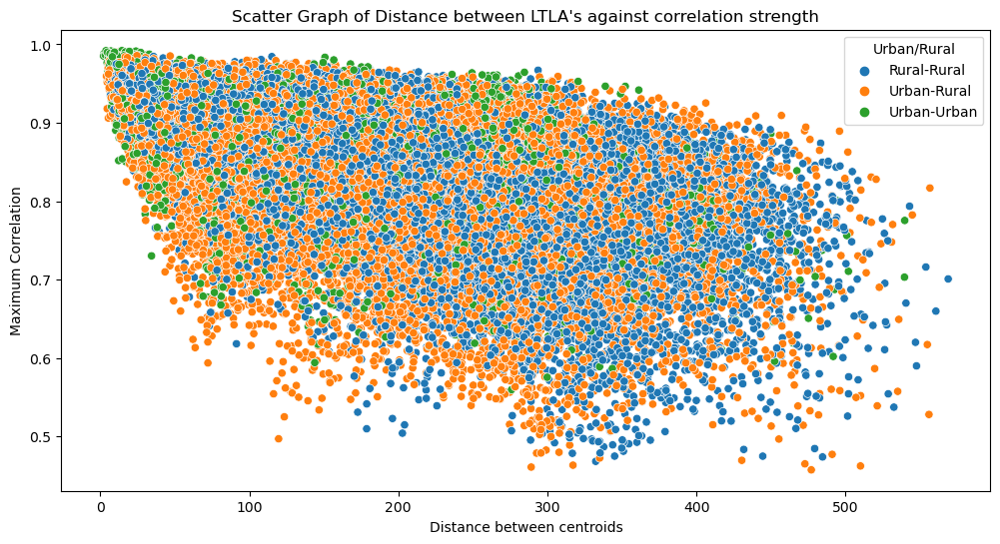

In [339]:
plt.figure(figsize=(12,6))

sns.scatterplot(data = tw_corrs, x = "Distance between centroids", y = "Maximum Correlation", hue = 'Urban/Rural')
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [340]:
data1 = urban_urban3['Distance between centroids']
data2 = urban_urban3['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Urban-Urban Correlation: %.3f' % corr)

data3 = urban_rural3['Distance between centroids']
data4 = urban_rural3['Maximum Correlation']

corr, _ = pearsonr(data3, data4)
print('Urban-Rural Correlation: %.3f' % corr)

data5 = rural_rural3['Distance between centroids']
data6 = rural_rural3['Maximum Correlation']

corr, _ = pearsonr(data5, data6)
print('Rural-Rural Correlation: %.3f' % corr)

Urban-Urban Correlation: -0.469
Urban-Rural Correlation: -0.438
Rural-Rural Correlation: -0.609


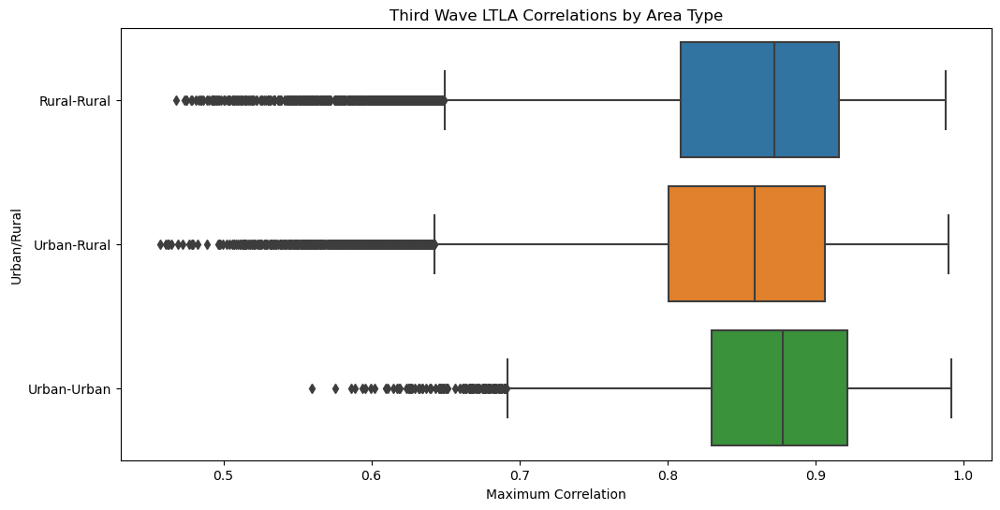

In [341]:
plt.figure(figsize=(12,6))
sns.boxplot(x=tw_corrs["Maximum Correlation"], y= tw_corrs['Urban/Rural'])
plt.title('Third Wave LTLA Correlations by Area Type')
plt.show()

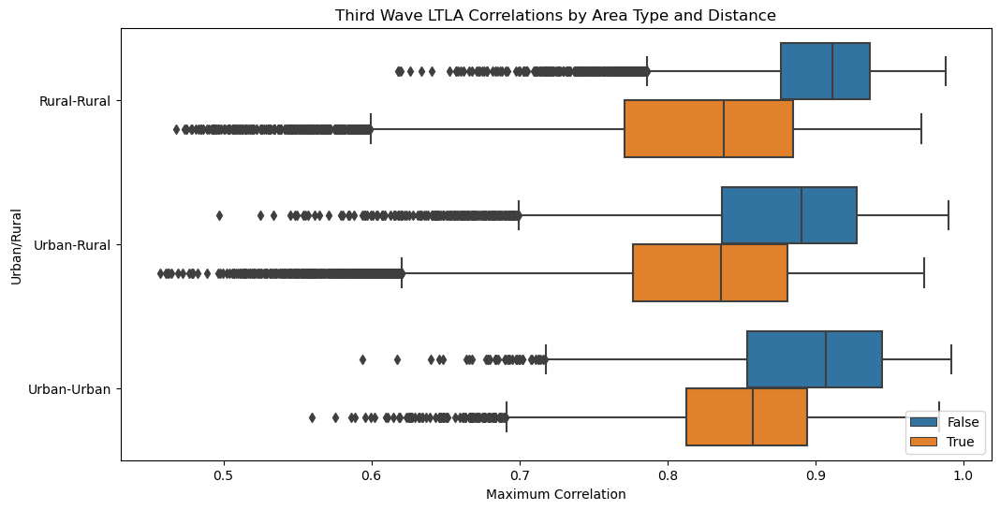

In [342]:
plt.figure(figsize=(12,6))
sns.boxplot(x=tw_corrs["Maximum Correlation"], y= tw_corrs['Urban/Rural'], hue = tw_corrs['Distance > 150km?'])
plt.title('Third Wave LTLA Correlations by Area Type and Distance')
plt.legend(loc='lower right')
plt.show()

In [343]:
rtw_corrs = pd.read_csv('Third_Wave_R.csv')

In [344]:
rtw_corrs = rtw_corrs.loc[rtw_corrs['LTLA 1'] != 'Hackney and City of London']
rtw_corrs = rtw_corrs.loc[rtw_corrs['LTLA 2'] != 'Hackney and City of London']
rtw_corrs['LTLA 1'] = rtw_corrs['LTLA 1'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])
rtw_corrs['LTLA 2'] = rtw_corrs['LTLA 2'].replace(['Cornwall and Isles of Scilly'], ['Cornwall'])
rtw_corrs['Urban/Rural'] = urbanrural
rtw_corrs['Distance > 150km?'] = distancecheck

In [345]:
rtw_corrs['Distance between centroids'] = list(fwr_corrs['Distance between centroids'])

In [346]:
urban_urban3r = rtw_corrs.loc[rtw_corrs['Urban/Rural'] == 'Urban-Urban']
urban_rural3r = rtw_corrs.loc[rtw_corrs['Urban/Rural'] == 'Urban-Rural']
rural_rural3r = rtw_corrs.loc[rtw_corrs['Urban/Rural'] == 'Rural-Rural']

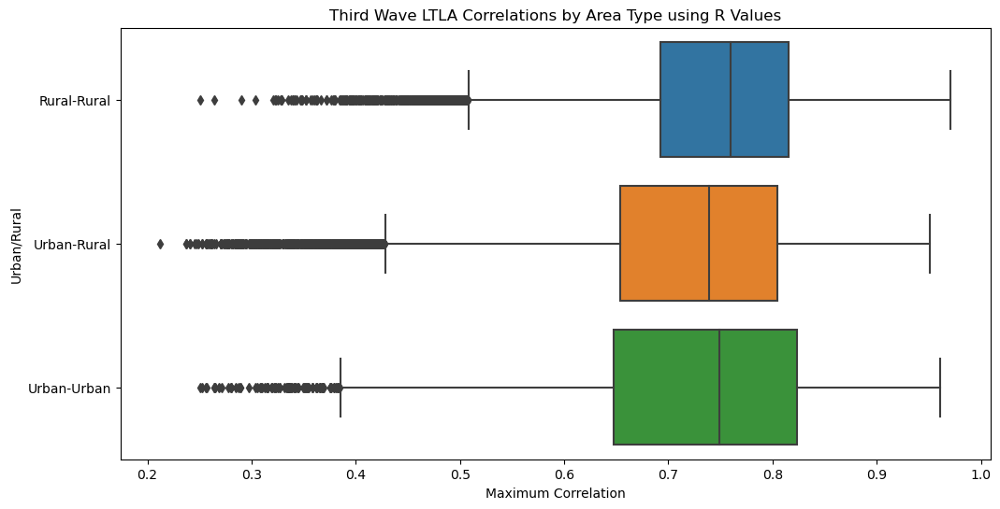

In [347]:
plt.figure(figsize=(12,6))
sns.boxplot(x=rtw_corrs["Maximum Correlation"], y= rtw_corrs['Urban/Rural'])
plt.title('Third Wave LTLA Correlations by Area Type using R Values')
plt.show()

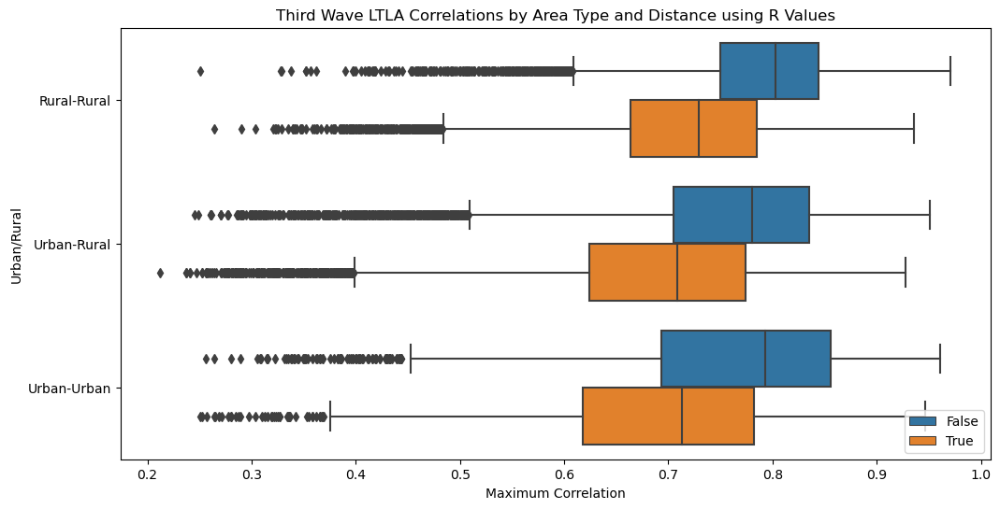

In [348]:
plt.figure(figsize=(12,6))
sns.boxplot(x=rtw_corrs["Maximum Correlation"], y= rtw_corrs['Urban/Rural'], hue = rtw_corrs['Distance > 150km?'])
plt.title('Third Wave LTLA Correlations by Area Type and Distance using R Values')
plt.legend(loc='lower right')
plt.show()

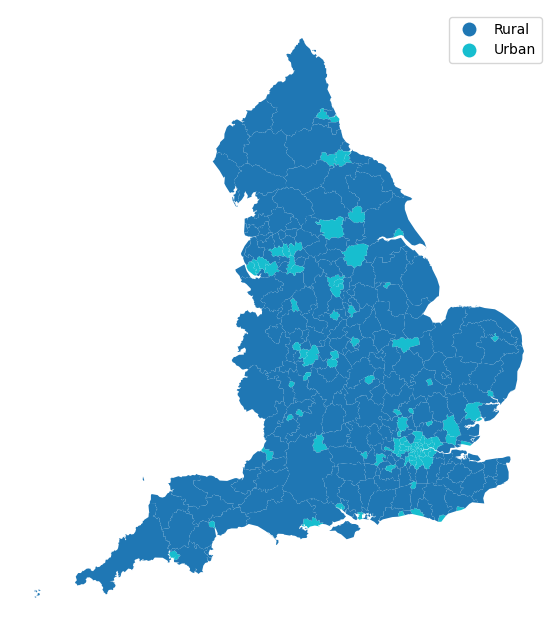

In [361]:
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
map_df.plot(column='Urban/Rural', linewidth=0.8, ax=ax, legend = True)
#ax = map_df.plot(column = 'Urban/Rural', legend=True)

#map_df.plot(column = 'Urban/Rural', legend = True)
plt.show()

In [362]:
urban_urban2

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids
1250,Worthing,Bolton,0.638219,-70.0,Urban-Urban,True,336.729705
1255,Worthing,Hounslow,0.944429,0.0,Urban-Urban,False,70.936113
1256,Worthing,Wandsworth,0.899638,-7.0,Urban-Urban,False,70.578878
1257,Worthing,Westminster,0.888493,-7.0,Urban-Urban,False,77.706659
1268,Worthing,Merton,0.903297,-7.0,Urban-Urban,False,65.903943
...,...,...,...,...,...,...,...
49414,Stevenage,Colchester,0.947449,0.0,Urban-Urban,False,72.276873
49418,Stevenage,Hillingdon,0.958105,0.0,Urban-Urban,False,43.981009
49422,St. Helens,Colchester,0.764283,-7.0,Urban-Urban,True,299.466958
49426,St. Helens,Hillingdon,0.729897,-7.0,Urban-Urban,True,263.485813


In [364]:
pops = pd.read_csv('Populations4.csv')

In [365]:
pops

,Code,Name,Geography1,All ages
0,K02000001,UNITED KINGDOM,Country,66796807.0
1,K03000001,GREAT BRITAIN,Country,64903140.0
2,K04000001,ENGLAND AND WALES,Country,59439840.0
3,E92000001,ENGLAND,Country,56286961.0
4,E12000001,NORTH EAST,Region,2669941.0
...,...,...,...,...
357,E07000189,South Somerset,Non-metropolitan District,168345.0
358,NaN,Aylesbury Vale,NaN,199448.0
359,NaN,Wycombe,NaN,140000.0
360,NaN,South Bucks,NaN,70043.0


In [366]:
urban_urban2 = urban_urban2.merge(pops, how='left', left_on='LTLA 1', right_on='Name')


,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Code,Name,Geography1,All ages
0,Worthing,Bolton,0.638219,-70.0,Urban-Urban,True,336.729705,E07000229,Worthing,Non-metropolitan District,110570.0
1,Worthing,Hounslow,0.944429,0.0,Urban-Urban,False,70.936113,E07000229,Worthing,Non-metropolitan District,110570.0
2,Worthing,Wandsworth,0.899638,-7.0,Urban-Urban,False,70.578878,E07000229,Worthing,Non-metropolitan District,110570.0
3,Worthing,Westminster,0.888493,-7.0,Urban-Urban,False,77.706659,E07000229,Worthing,Non-metropolitan District,110570.0
4,Worthing,Merton,0.903297,-7.0,Urban-Urban,False,65.903943,E07000229,Worthing,Non-metropolitan District,110570.0
...,...,...,...,...,...,...,...,...,...,...,...
4273,Stevenage,Colchester,0.947449,0.0,Urban-Urban,False,72.276873,E07000243,Stevenage,Non-metropolitan District,87845.0
4274,Stevenage,Hillingdon,0.958105,0.0,Urban-Urban,False,43.981009,E07000243,Stevenage,Non-metropolitan District,87845.0
4275,St. Helens,Colchester,0.764283,-7.0,Urban-Urban,True,299.466958,E08000013,St. Helens,Metropolitan District,180585.0
4276,St. Helens,Hillingdon,0.729897,-7.0,Urban-Urban,True,263.485813,E08000013,St. Helens,Metropolitan District,180585.0


In [367]:
urban_urban2 = urban_urban2.merge(pops, how='left', left_on='LTLA 2', right_on='Name')
urban_urban2

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Code_x,Name_x,Geography1_x,All ages_x,Code_y,Name_y,Geography1_y,All ages_y
0,Worthing,Bolton,0.638219,-70.0,Urban-Urban,True,336.729705,E07000229,Worthing,Non-metropolitan District,110570.0,E08000001,Bolton,Metropolitan District,287550.0
1,Worthing,Hounslow,0.944429,0.0,Urban-Urban,False,70.936113,E07000229,Worthing,Non-metropolitan District,110570.0,E09000018,Hounslow,London Borough,271523.0
2,Worthing,Wandsworth,0.899638,-7.0,Urban-Urban,False,70.578878,E07000229,Worthing,Non-metropolitan District,110570.0,E09000032,Wandsworth,London Borough,329677.0
3,Worthing,Westminster,0.888493,-7.0,Urban-Urban,False,77.706659,E07000229,Worthing,Non-metropolitan District,110570.0,E09000033,Westminster,London Borough,261317.0
4,Worthing,Merton,0.903297,-7.0,Urban-Urban,False,65.903943,E07000229,Worthing,Non-metropolitan District,110570.0,E09000024,Merton,London Borough,206548.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4273,Stevenage,Colchester,0.947449,0.0,Urban-Urban,False,72.276873,E07000243,Stevenage,Non-metropolitan District,87845.0,E07000071,Colchester,Non-metropolitan District,194706.0
4274,Stevenage,Hillingdon,0.958105,0.0,Urban-Urban,False,43.981009,E07000243,Stevenage,Non-metropolitan District,87845.0,E09000017,Hillingdon,London Borough,306870.0
4275,St. Helens,Colchester,0.764283,-7.0,Urban-Urban,True,299.466958,E08000013,St. Helens,Metropolitan District,180585.0,E07000071,Colchester,Non-metropolitan District,194706.0
4276,St. Helens,Hillingdon,0.729897,-7.0,Urban-Urban,True,263.485813,E08000013,St. Helens,Metropolitan District,180585.0,E09000017,Hillingdon,London Borough,306870.0


In [368]:
urban_urban2 = urban_urban2.drop(columns = ['Code_x', 'Name_x', 'Geography1_x', 'Code_y', 'Name_y', 'Geography1_y'])
urban_urban2 = urban_urban2.rename(columns = {'All ages_x':'LTLA 1 Population', 'All ages_y':'LTLA 2 Population'})
urban_urban2

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,LTLA 1 Population,LTLA 2 Population
0,Worthing,Bolton,0.638219,-70.0,Urban-Urban,True,336.729705,110570.0,287550.0
1,Worthing,Hounslow,0.944429,0.0,Urban-Urban,False,70.936113,110570.0,271523.0
2,Worthing,Wandsworth,0.899638,-7.0,Urban-Urban,False,70.578878,110570.0,329677.0
3,Worthing,Westminster,0.888493,-7.0,Urban-Urban,False,77.706659,110570.0,261317.0
4,Worthing,Merton,0.903297,-7.0,Urban-Urban,False,65.903943,110570.0,206548.0
...,...,...,...,...,...,...,...,...,...
4273,Stevenage,Colchester,0.947449,0.0,Urban-Urban,False,72.276873,87845.0,194706.0
4274,Stevenage,Hillingdon,0.958105,0.0,Urban-Urban,False,43.981009,87845.0,306870.0
4275,St. Helens,Colchester,0.764283,-7.0,Urban-Urban,True,299.466958,180585.0,194706.0
4276,St. Helens,Hillingdon,0.729897,-7.0,Urban-Urban,True,263.485813,180585.0,306870.0


In [371]:
tw_corrs

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids
0,Redcar and Cleveland,East Devon,0.534703,0.0,Rural-Rural,True,446.686187
1,Redcar and Cleveland,Havant,0.718688,0.0,Rural-Rural,True,411.943769
2,Redcar and Cleveland,Surrey Heath,0.709259,0.0,Rural-Rural,True,357.783404
3,Redcar and Cleveland,Worthing,0.615529,0.0,Urban-Rural,True,416.062959
4,Redcar and Cleveland,Bolton,0.907420,0.0,Urban-Rural,False,143.901356
...,...,...,...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.917484,0.0,Rural-Rural,True,181.384385
49451,Basingstoke and Deane,Hillingdon,0.906936,0.0,Urban-Rural,False,60.445984
49452,Tunbridge Wells,Rushcliffe,0.903993,0.0,Rural-Rural,True,222.863872
49453,Tunbridge Wells,Hillingdon,0.868682,0.0,Urban-Rural,False,77.442951


In [373]:
fw_corrs= fw_corrs.drop(columns=['LAD19NM_x', 'Urban/Rural_x', 'Urban/Rural_y', 'LAD19NM_y'])


,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids,Urban/Rural,Absolute Lag Value,Distance > 150km?
0,Redcar and Cleveland,East Devon,0.597890,5.5,446.686187,Rural-Rural,5.5,True
1,Redcar and Cleveland,Havant,0.705012,-6.5,411.943769,Rural-Rural,6.5,True
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.5,357.783404,Rural-Rural,6.5,True
3,Redcar and Cleveland,Worthing,0.618926,-6.5,416.062959,Urban-Rural,6.5,True
4,Redcar and Cleveland,Bolton,0.696269,8.5,143.901356,Urban-Rural,8.5,False
...,...,...,...,...,...,...,...,...
49136,Basingstoke and Deane,Rushcliffe,0.476345,5.5,181.384385,Rural-Rural,5.5,True
49137,Basingstoke and Deane,Hillingdon,0.750190,-3.5,60.445984,Urban-Rural,3.5,False
49138,Tunbridge Wells,Rushcliffe,0.382597,-7.5,222.863872,Rural-Rural,7.5,True
49139,Tunbridge Wells,Hillingdon,0.413961,-47.5,77.442951,Urban-Rural,47.5,False


In [374]:
fw_corrs = fw_corrs.drop(columns=['Absolute Lag Value'])

In [376]:
fw_corrs = fw_corrs.iloc[:, [0,1,2,3,5,6,4]]
fw_corrs

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids
0,Redcar and Cleveland,East Devon,0.597890,5.5,Rural-Rural,True,446.686187
1,Redcar and Cleveland,Havant,0.705012,-6.5,Rural-Rural,True,411.943769
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.5,Rural-Rural,True,357.783404
3,Redcar and Cleveland,Worthing,0.618926,-6.5,Urban-Rural,True,416.062959
4,Redcar and Cleveland,Bolton,0.696269,8.5,Urban-Rural,False,143.901356
...,...,...,...,...,...,...,...
49136,Basingstoke and Deane,Rushcliffe,0.476345,5.5,Rural-Rural,True,181.384385
49137,Basingstoke and Deane,Hillingdon,0.750190,-3.5,Urban-Rural,False,60.445984
49138,Tunbridge Wells,Rushcliffe,0.382597,-7.5,Rural-Rural,True,222.863872
49139,Tunbridge Wells,Hillingdon,0.413961,-47.5,Urban-Rural,False,77.442951


In [377]:
list1 = ['1st']
list1new = list1 * len(fw_corrs)


In [380]:
fw_corrs['Wave'] = list(list1new)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_56789/2133993525.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fw_corrs['Wave'] = list(list1new)


In [382]:
list2 = ['2nd']
list2new = list2 * len(sw_corrs)
sw_corrs['Wave'] = list2new

In [384]:
list3 = ['3rd']
list3new = list3 * len(tw_corrs)
tw_corrs['Wave'] = list3new

In [506]:
all_waves = pd.concat([fw_corrs, sw_corrs, tw_corrs])

In [507]:
all_waves

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.0,Rural-Rural,True,357.783404,1st
3,Redcar and Cleveland,Worthing,0.618926,-6.0,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.917484,0.0,Rural-Rural,True,181.384385,3rd
49451,Basingstoke and Deane,Hillingdon,0.906936,0.0,Urban-Rural,False,60.445984,3rd
49452,Tunbridge Wells,Rushcliffe,0.903993,0.0,Rural-Rural,True,222.863872,3rd
49453,Tunbridge Wells,Hillingdon,0.868682,0.0,Urban-Rural,False,77.442951,3rd


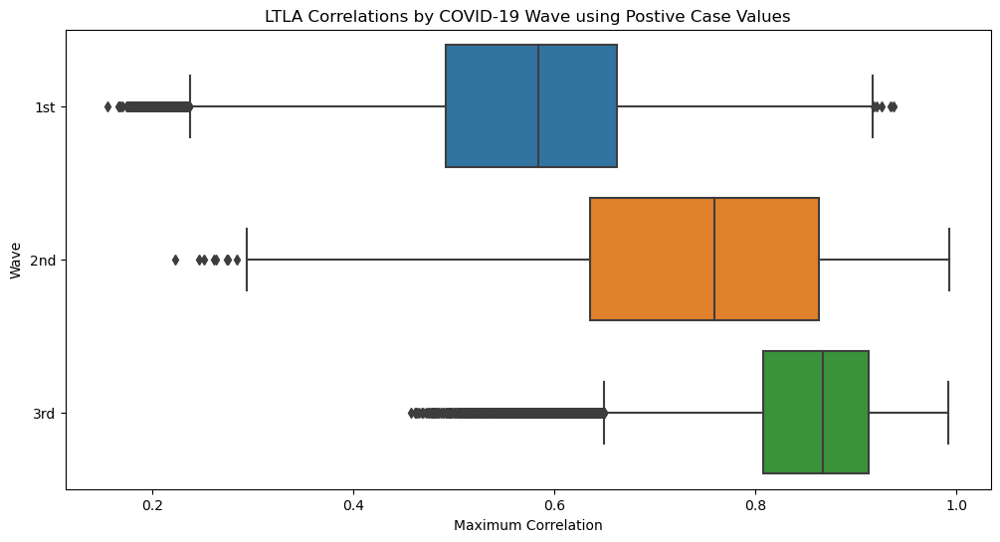

In [389]:
plt.figure(figsize=(12,6))
sns.boxplot(x=all_waves["Maximum Correlation"], y= all_waves['Wave'])
plt.title('LTLA Correlations by COVID-19 Wave using Postive Case Values')
plt.show()

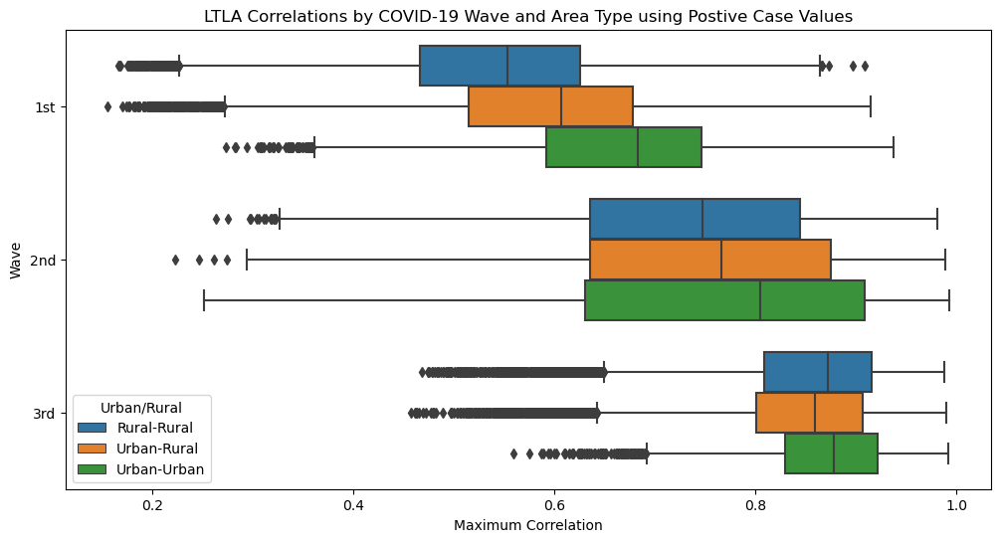

In [391]:
plt.figure(figsize=(12,6))
sns.boxplot(x=all_waves["Maximum Correlation"], y= all_waves['Wave'], hue=all_waves['Urban/Rural'])
plt.title('LTLA Correlations by COVID-19 Wave and Area Type using Postive Case Values')
plt.show()

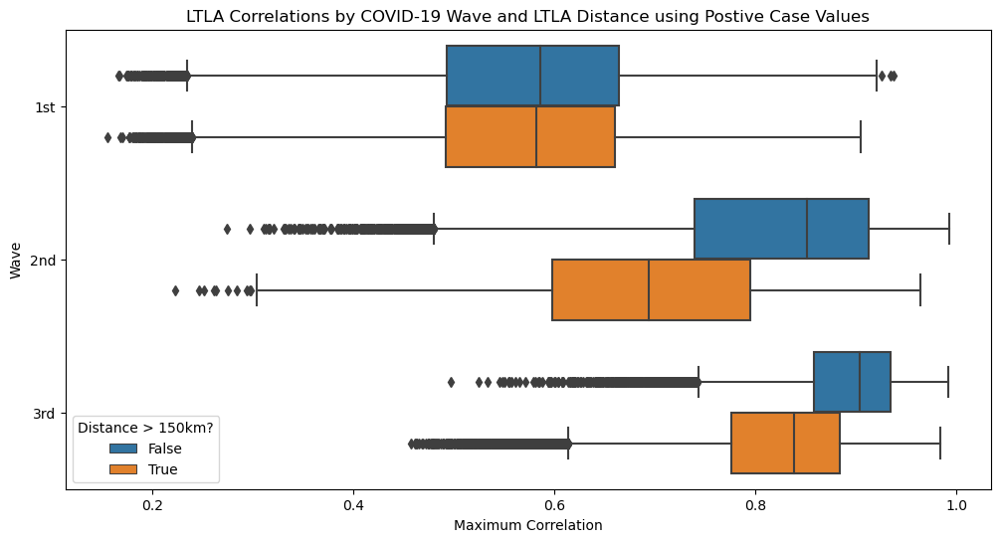

In [395]:
plt.figure(figsize=(12,6))
sns.boxplot(x=all_waves["Maximum Correlation"], y= all_waves['Wave'], hue=all_waves['Distance > 150km?'])
plt.title('LTLA Correlations by COVID-19 Wave and LTLA Distance using Postive Case Values')
plt.show()

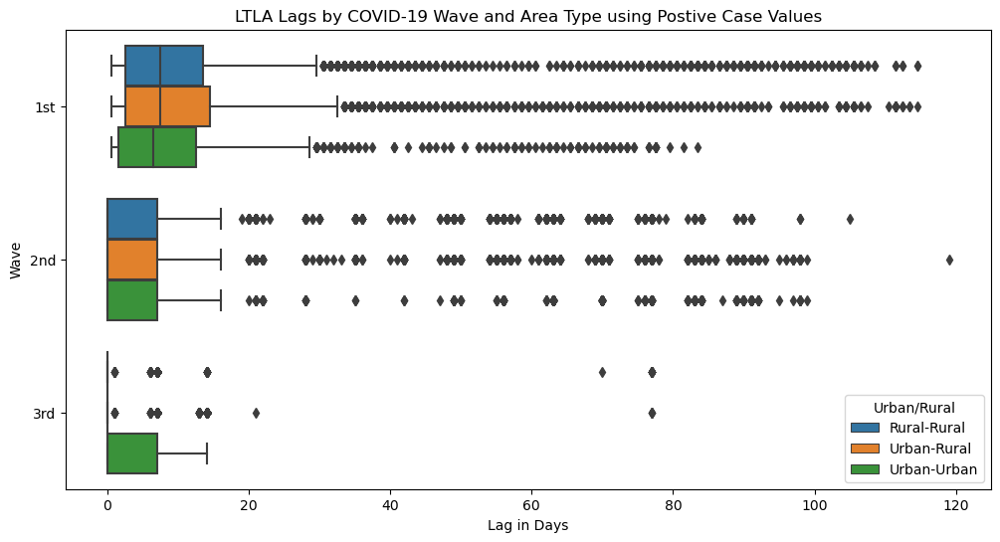

In [393]:
plt.figure(figsize=(12,6))
sns.boxplot(x=abs(all_waves["Lag in Days"]), y= all_waves['Wave'], hue=all_waves['Urban/Rural'])
plt.title('LTLA Lags by COVID-19 Wave and Area Type using Postive Case Values')
plt.show()

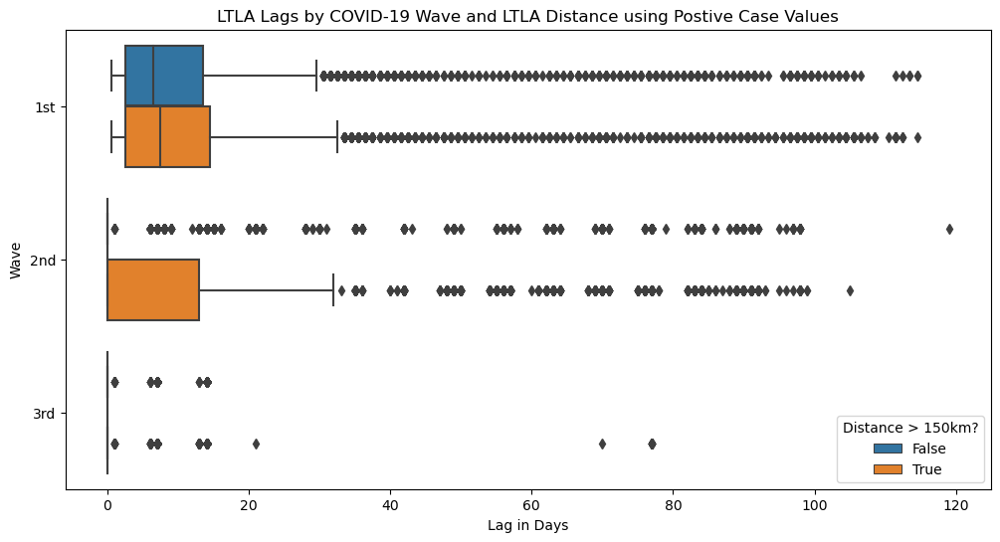

In [398]:
plt.figure(figsize=(12,6))
sns.boxplot(x=abs(all_waves["Lag in Days"]), y= all_waves['Wave'], hue=all_waves['Distance > 150km?'])
plt.title('LTLA Lags by COVID-19 Wave and LTLA Distance using Postive Case Values')
plt.show()

In [400]:
urban_urban2.describe()

,Maximum Correlation,Lag in Days,Distance between centroids,LTLA 1 Population,LTLA 2 Population
count,4278.000000,4278.000000,4278.000000,4.278000e+03,4.278000e+03
mean,0.772621,-1.076905,163.583224,2.374572e+05,2.508026e+05
std,0.154326,28.649967,107.924551,1.270523e+05,1.642446e+05
min,0.251514,-98.000000,2.246661,8.526100e+04,8.526100e+04
25%,0.630347,0.000000,71.423925,1.484520e+05,1.409800e+05
50%,0.805177,0.000000,151.962697,2.246100e+05,2.149050e+05
75%,0.908567,0.000000,248.112136,2.908850e+05,3.118900e+05
max,0.992296,99.000000,539.659494,1.141816e+06,1.141816e+06


In [402]:
largepops = [(urban_urban2['LTLA 1 Population'].iloc[i] > 300000) & (urban_urban2['LTLA 2 Population'].iloc[i] > 300000) for i in range(len(urban_urban2))]

In [403]:
urban_urban2['Both > 300,000 Population?'] = largepops


,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,LTLA 1 Population,LTLA 2 Population,"Both > 300,000 Population?"
0,Worthing,Bolton,0.638219,-70.0,Urban-Urban,True,336.729705,110570.0,287550.0,False
1,Worthing,Hounslow,0.944429,0.0,Urban-Urban,False,70.936113,110570.0,271523.0,False
2,Worthing,Wandsworth,0.899638,-7.0,Urban-Urban,False,70.578878,110570.0,329677.0,False
3,Worthing,Westminster,0.888493,-7.0,Urban-Urban,False,77.706659,110570.0,261317.0,False
4,Worthing,Merton,0.903297,-7.0,Urban-Urban,False,65.903943,110570.0,206548.0,False
...,...,...,...,...,...,...,...,...,...,...
4273,Stevenage,Colchester,0.947449,0.0,Urban-Urban,False,72.276873,87845.0,194706.0,False
4274,Stevenage,Hillingdon,0.958105,0.0,Urban-Urban,False,43.981009,87845.0,306870.0,False
4275,St. Helens,Colchester,0.764283,-7.0,Urban-Urban,True,299.466958,180585.0,194706.0,False
4276,St. Helens,Hillingdon,0.729897,-7.0,Urban-Urban,True,263.485813,180585.0,306870.0,False


In [409]:
urbantest = urban_urban2.loc[urban_urban2['Distance between centroids'] > 150]

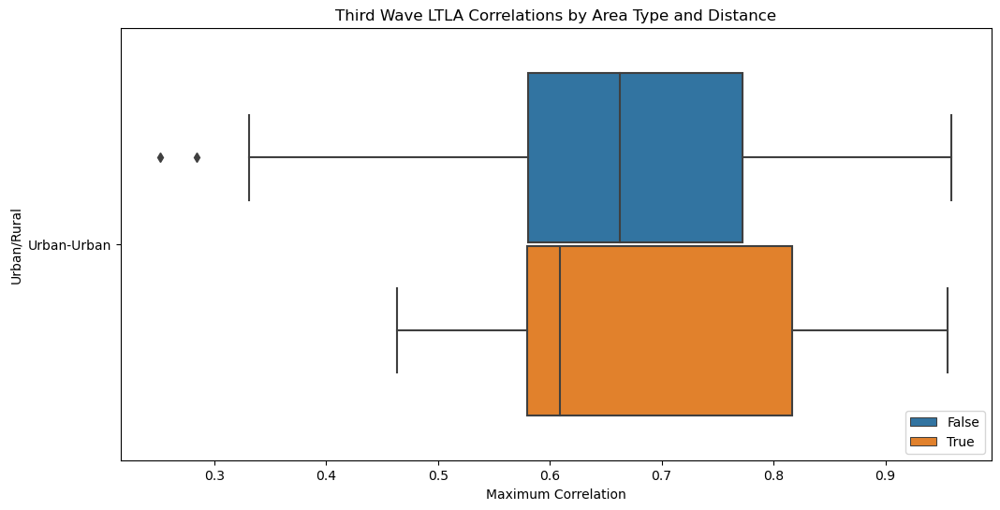

In [410]:
plt.figure(figsize=(12,6))
sns.boxplot(x=urbantest["Maximum Correlation"], y= urbantest['Urban/Rural'], hue=urbantest['Both > 300,000 Population?'])
plt.title('Third Wave LTLA Correlations by Area Type and Distance')
plt.legend(loc='lower right')
plt.show()

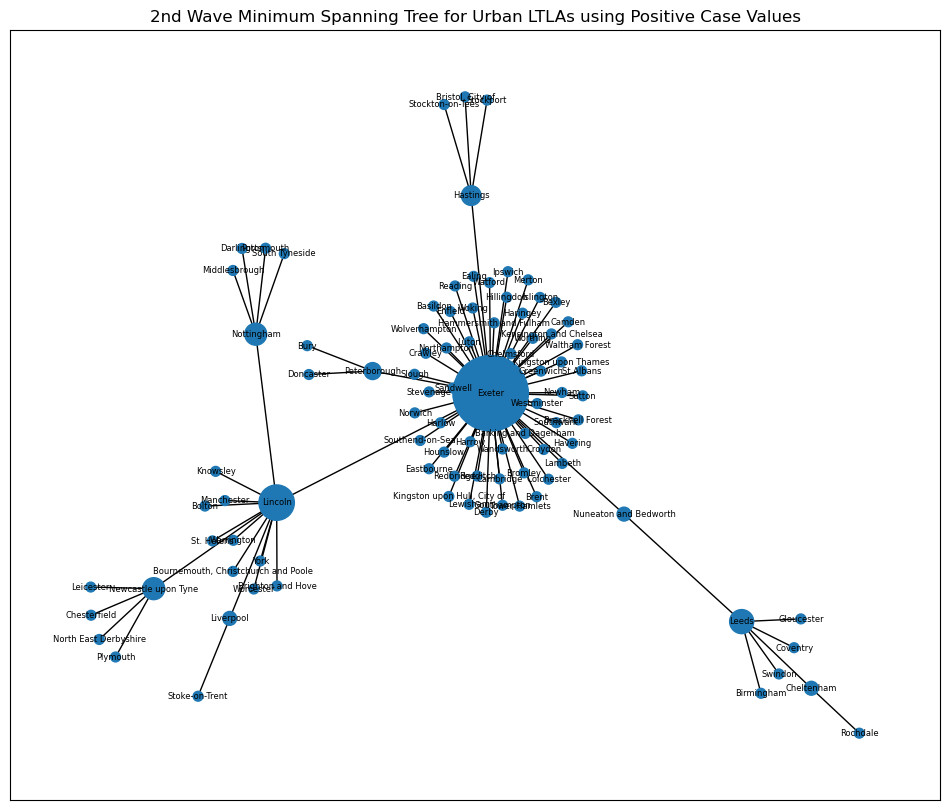

In [476]:
#G = nx.Graph()
G = nx.from_pandas_edgelist(urban_urban2,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=1)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('2nd Wave Minimum Spanning Tree for Urban LTLAs using Positive Case Values')
plt.show()

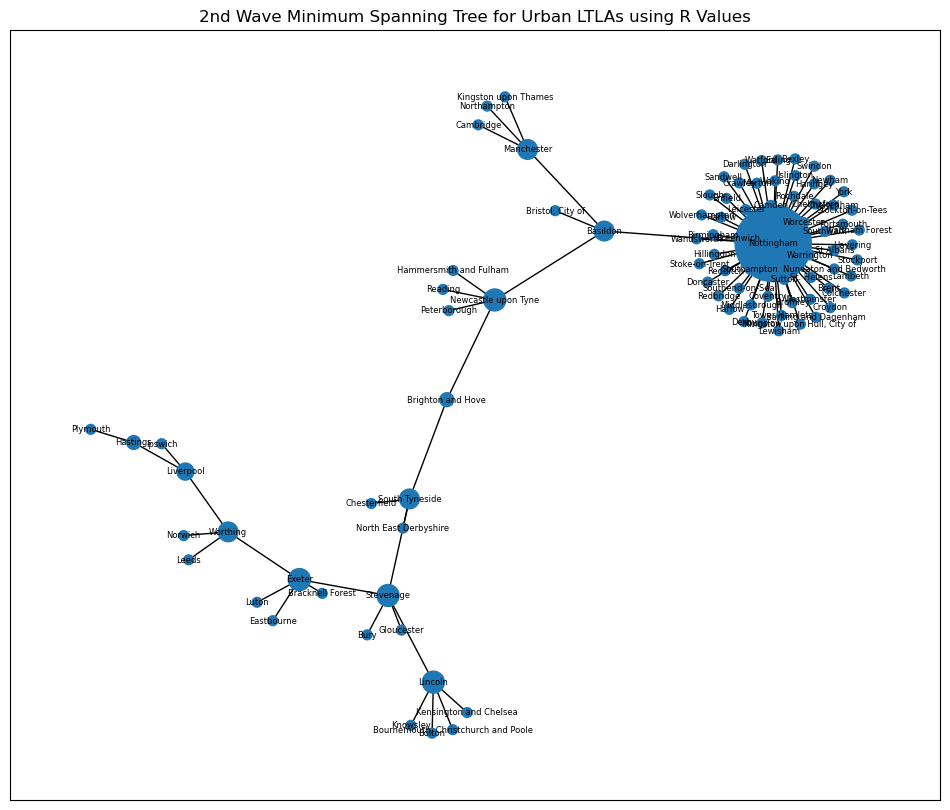

In [475]:
#G = nx.Graph()
G = nx.from_pandas_edgelist(urban_urban2r,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=1)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('2nd Wave Minimum Spanning Tree for Urban LTLAs using R Values')
plt.show()

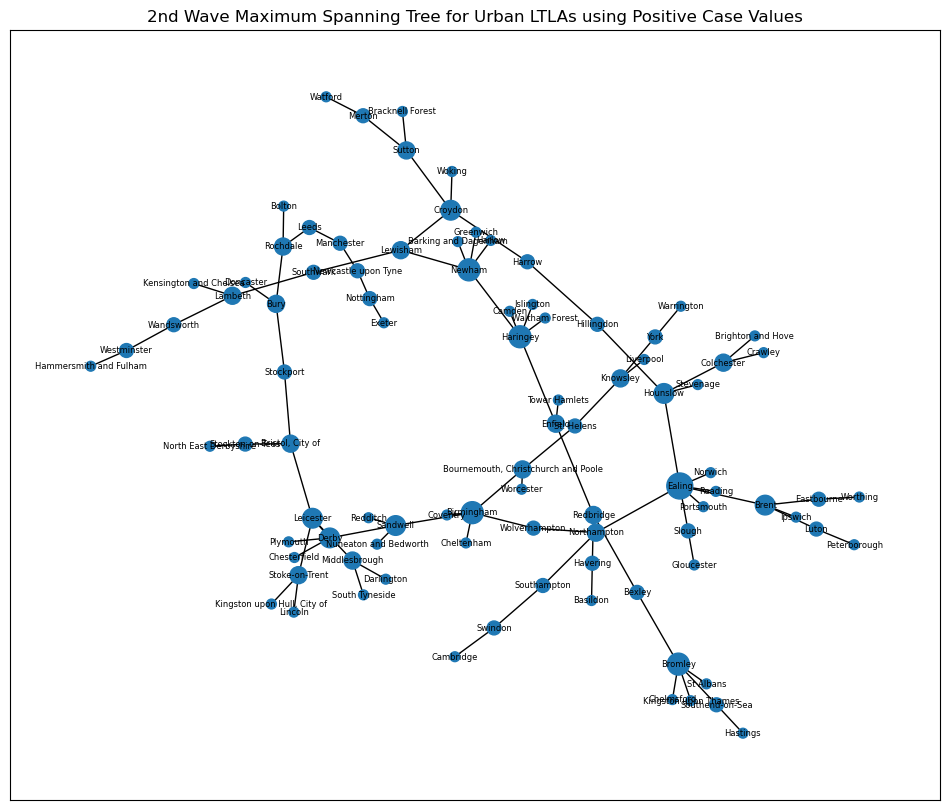

In [474]:
#G = nx.Graph()
G = nx.from_pandas_edgelist(urban_urban2,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('2nd Wave Maximum Spanning Tree for Urban LTLAs using Positive Case Values')
plt.show()

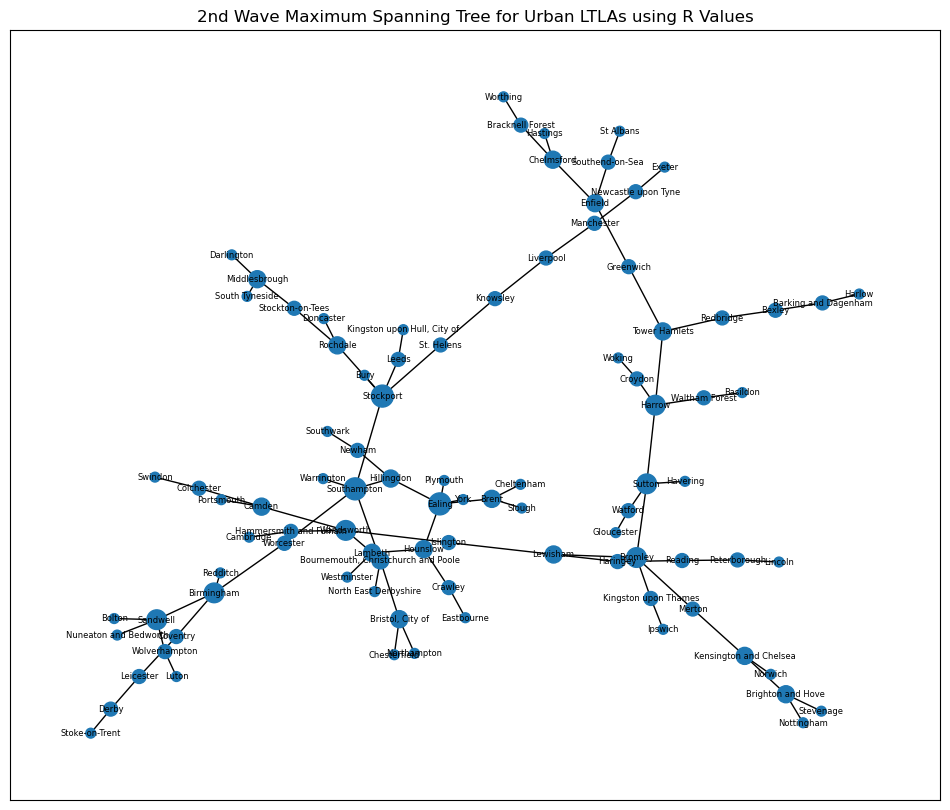

In [473]:
#G = nx.Graph()
G = nx.from_pandas_edgelist(urban_urban2r,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('2nd Wave Maximum Spanning Tree for Urban LTLAs using R Values')
plt.show()

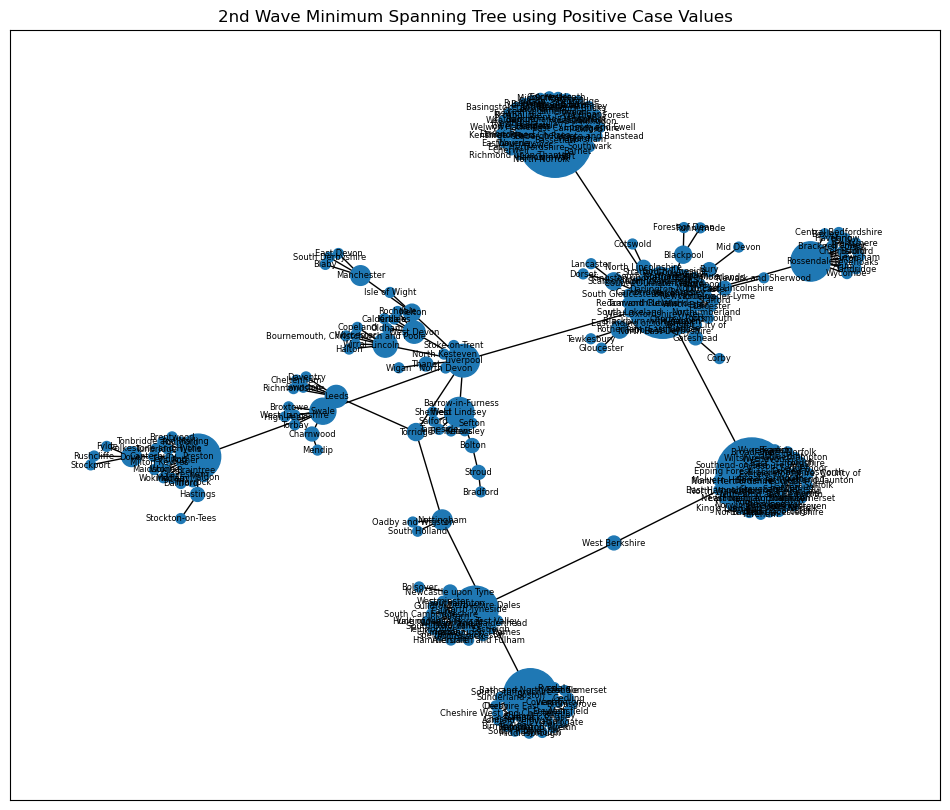

In [472]:
#G = nx.Graph()
G = nx.from_pandas_edgelist(sw_corrs,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('2nd Wave Minimum Spanning Tree using Positive Case Values')
plt.show()

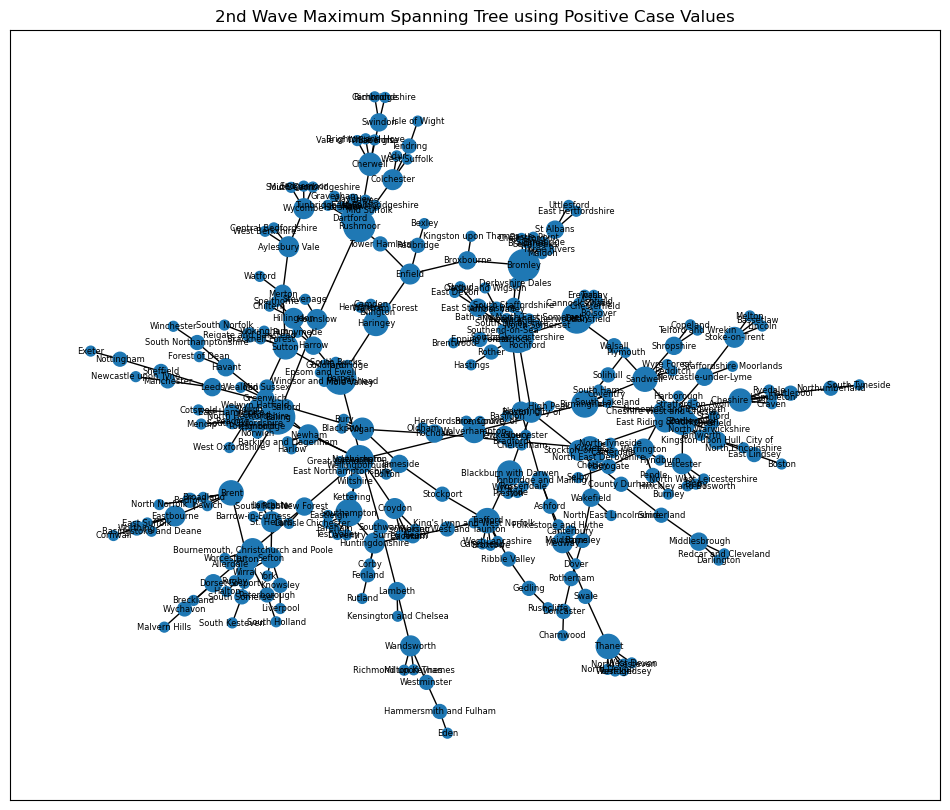

In [471]:
#G = nx.Graph()
G = nx.from_pandas_edgelist(sw_corrs,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('2nd Wave Maximum Spanning Tree using Positive Case Values')
plt.show()

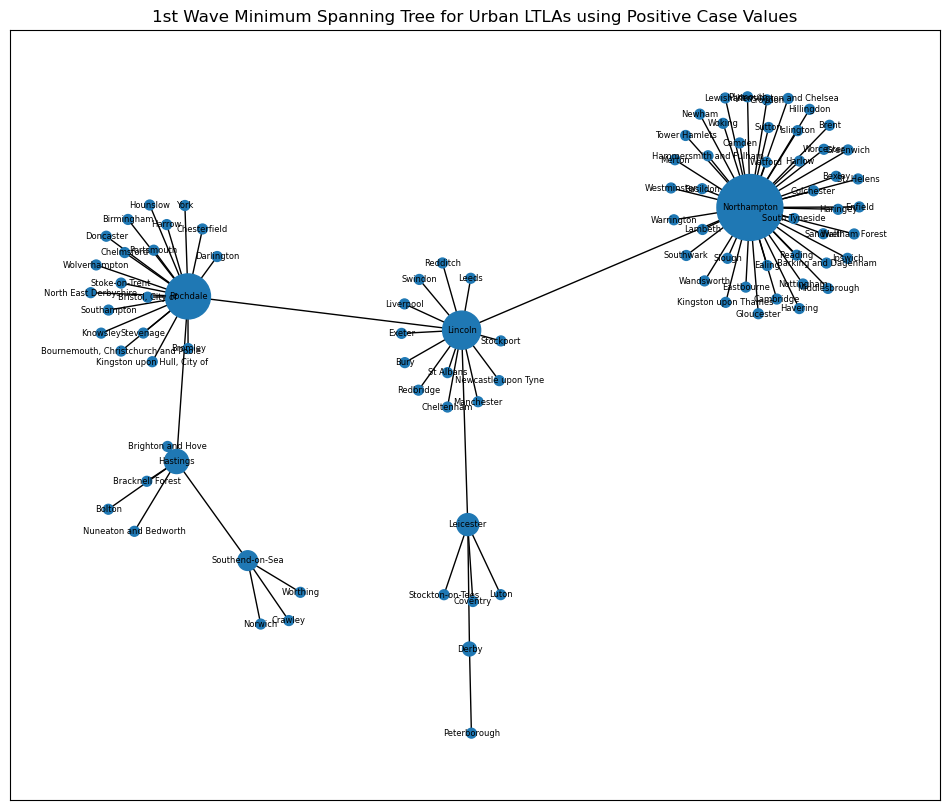

In [468]:
G = nx.from_pandas_edgelist(urban_urban,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Minimum Spanning Tree for Urban LTLAs using Positive Case Values')
plt.show()

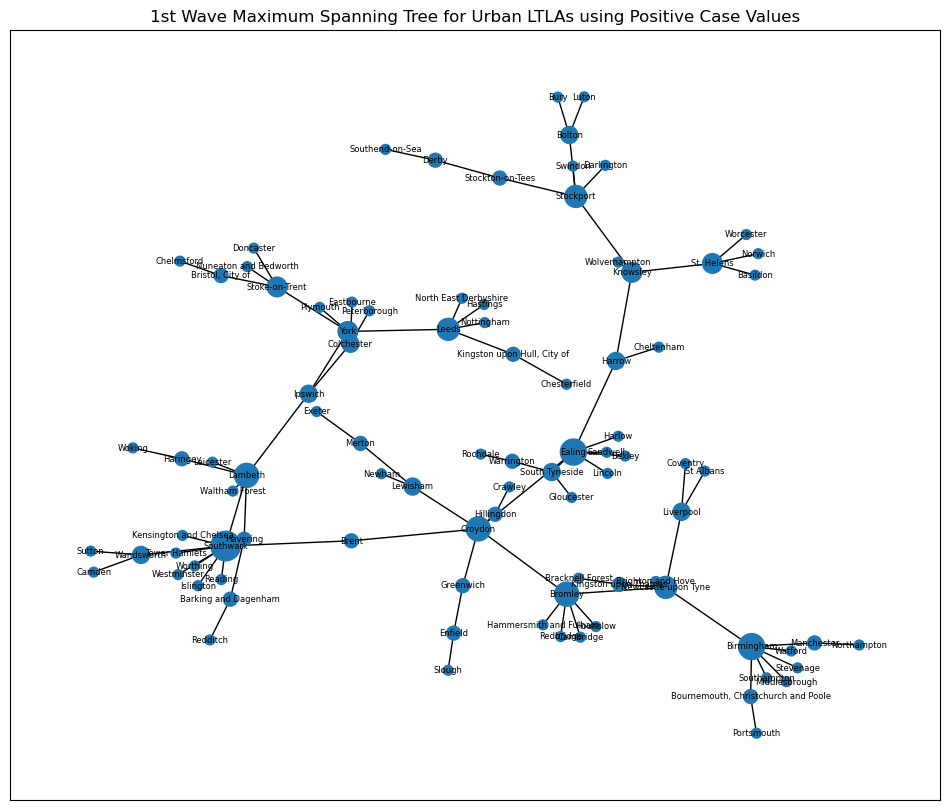

In [477]:
G = nx.from_pandas_edgelist(urban_urban,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Maximum Spanning Tree for Urban LTLAs using Positive Case Values')
plt.show()

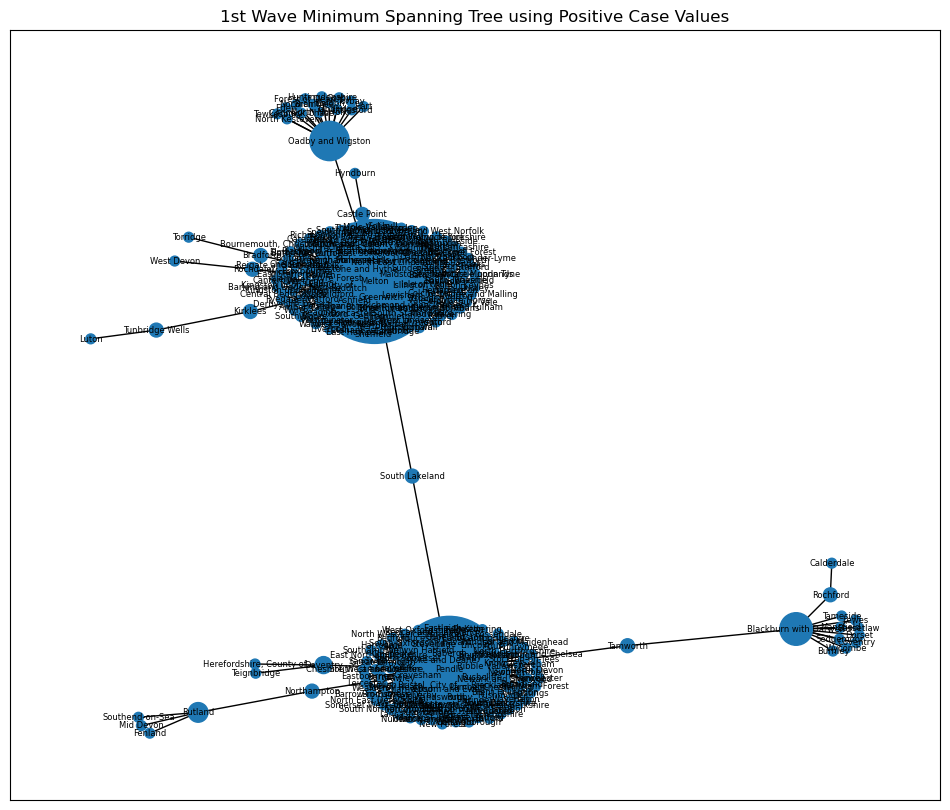

In [480]:
G = nx.from_pandas_edgelist(fw_corrs,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Minimum Spanning Tree using Positive Case Values')
plt.show()

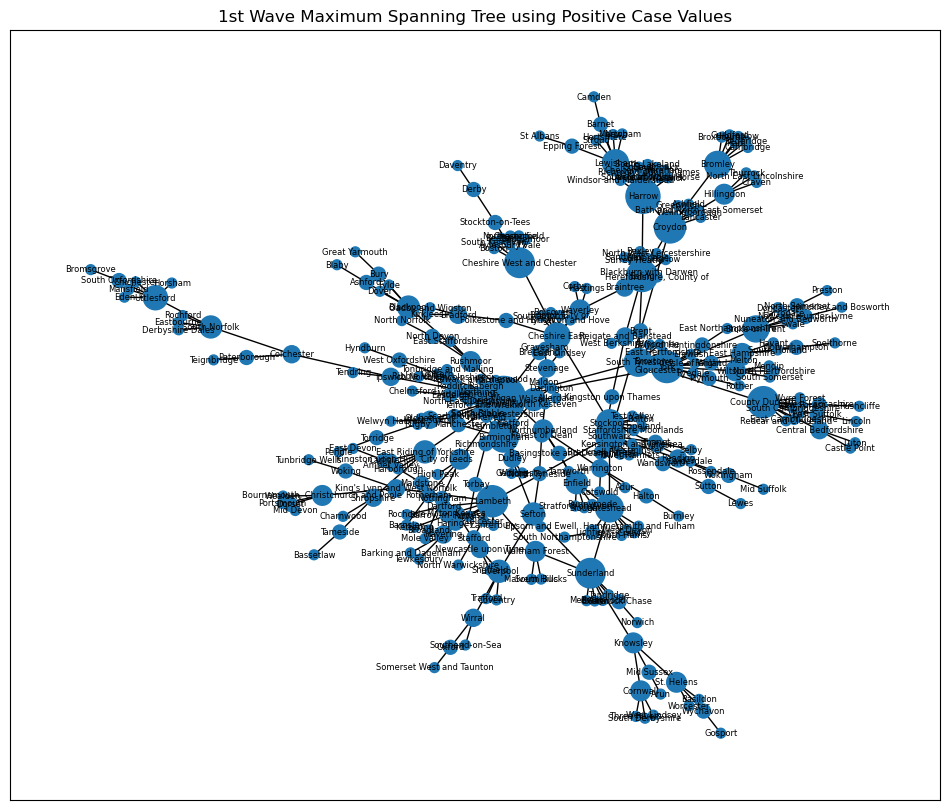

In [481]:
G = nx.from_pandas_edgelist(fw_corrs,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Maximum Spanning Tree using Positive Case Values')
plt.show()

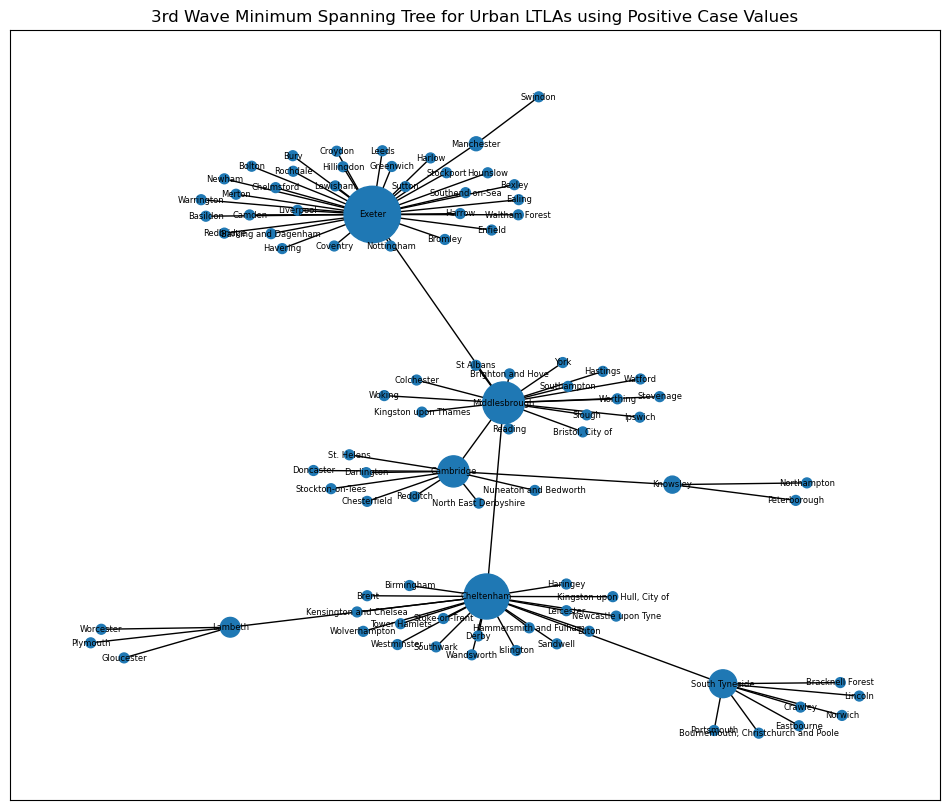

In [482]:
G = nx.from_pandas_edgelist(urban_urban3,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('3rd Wave Minimum Spanning Tree for Urban LTLAs using Positive Case Values')
plt.show()

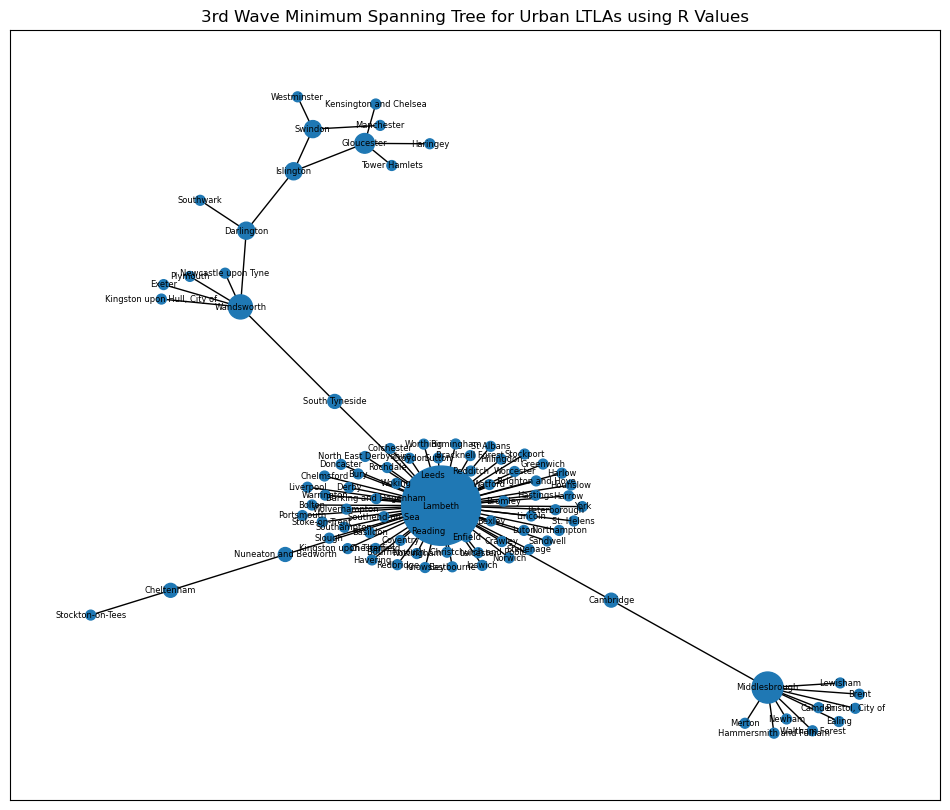

In [483]:
G = nx.from_pandas_edgelist(urban_urban3r,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('3rd Wave Minimum Spanning Tree for Urban LTLAs using R Values')
plt.show()

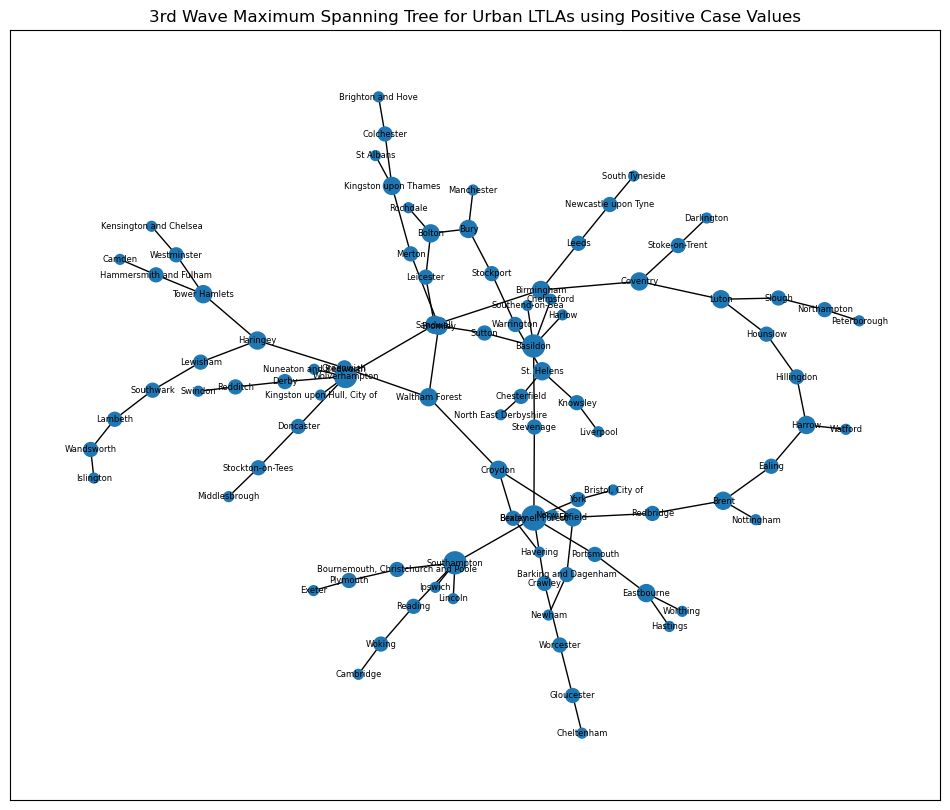

In [485]:
G = nx.from_pandas_edgelist(urban_urban3,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('3rd Wave Maximum Spanning Tree for Urban LTLAs using Positive Case Values')
plt.show()

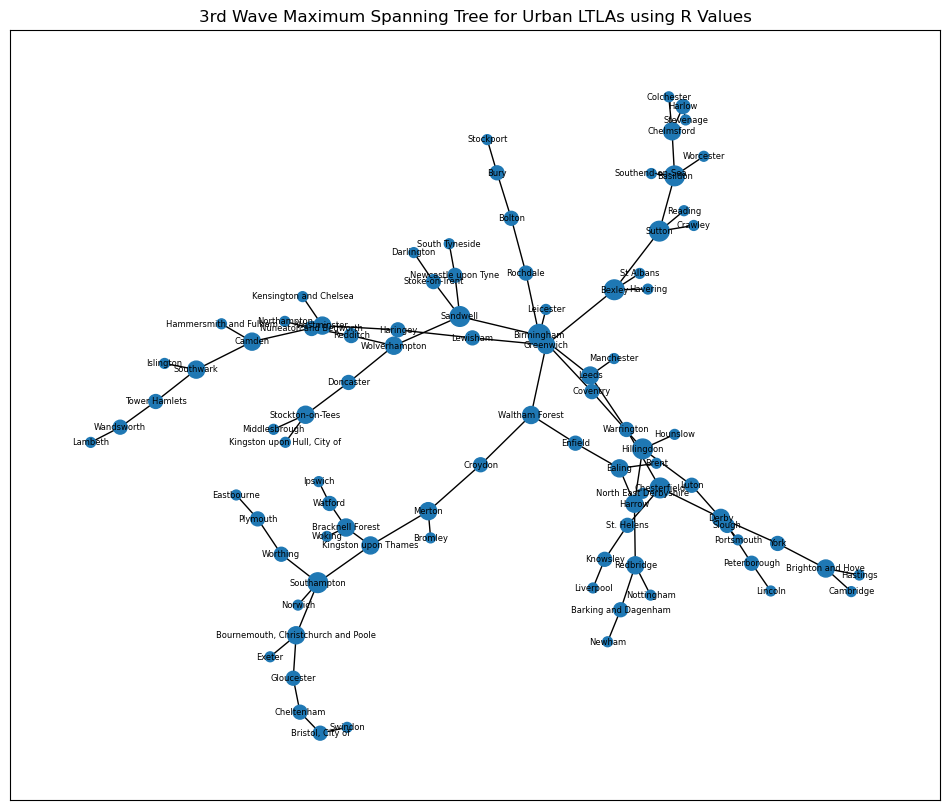

In [486]:
G = nx.from_pandas_edgelist(urban_urban3r,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('3rd Wave Maximum Spanning Tree for Urban LTLAs using R Values')
plt.show()

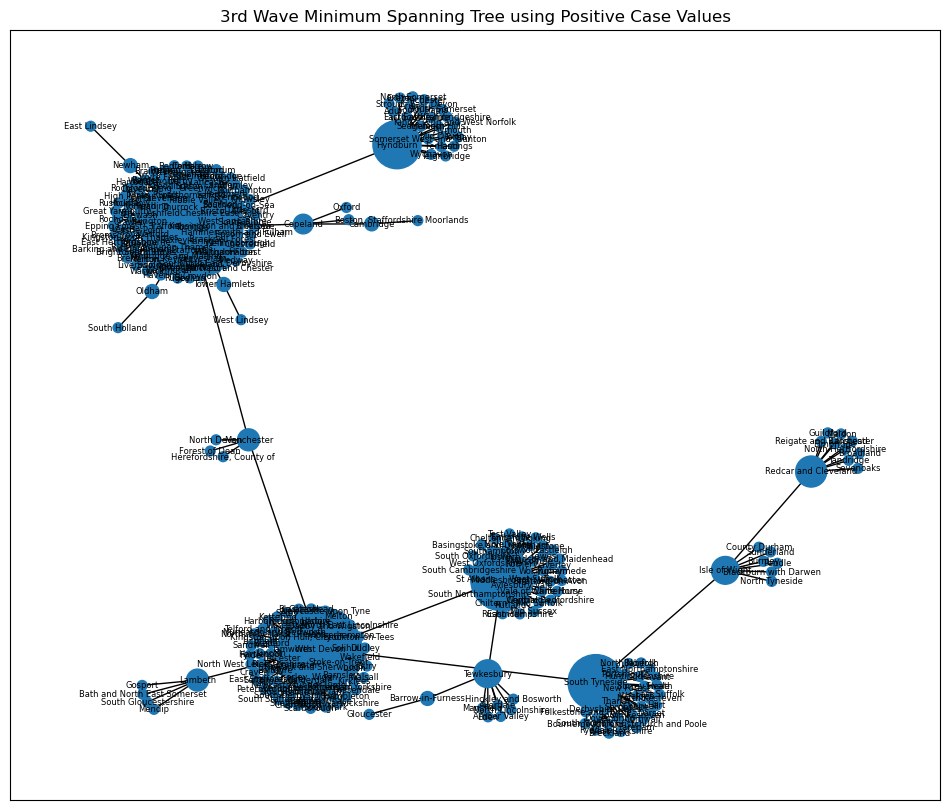

In [489]:
G = nx.from_pandas_edgelist(tw_corrs,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('3rd Wave Minimum Spanning Tree using Positive Case Values')
plt.show()

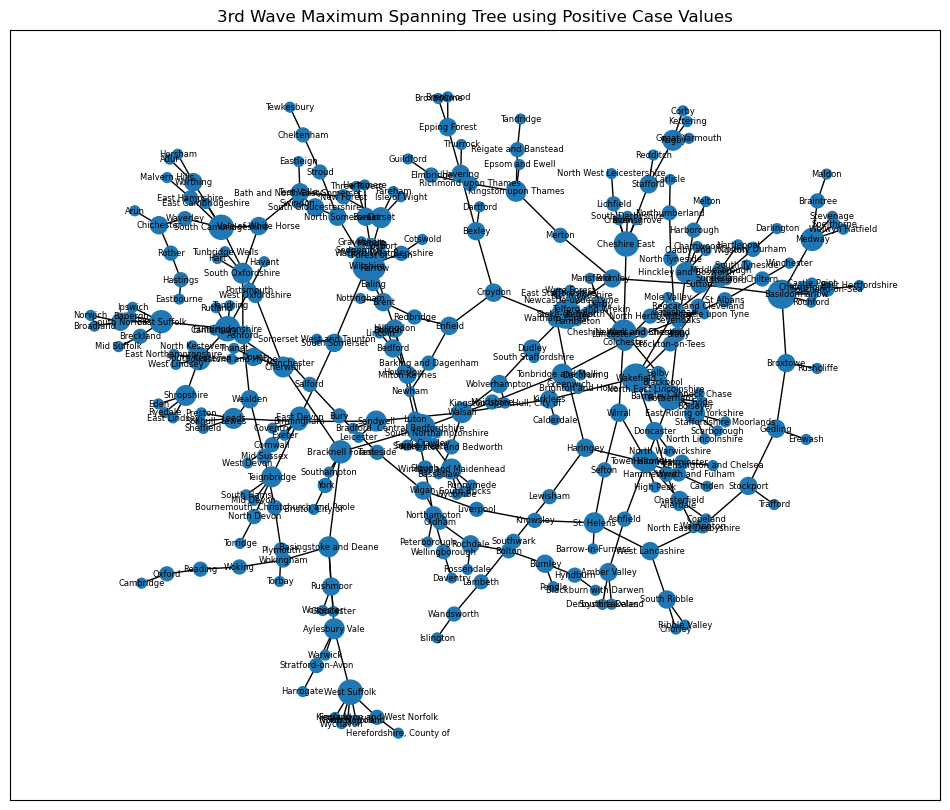

In [487]:
G = nx.from_pandas_edgelist(tw_corrs,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=3)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('3rd Wave Maximum Spanning Tree using Positive Case Values')
plt.show()

# Lag Analysis

In [490]:
all_waves

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,5.5,Rural-Rural,True,446.686187,1st
1,Redcar and Cleveland,Havant,0.705012,-6.5,Rural-Rural,True,411.943769,1st
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.5,Rural-Rural,True,357.783404,1st
3,Redcar and Cleveland,Worthing,0.618926,-6.5,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,8.5,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.917484,0.0,Rural-Rural,True,181.384385,3rd
49451,Basingstoke and Deane,Hillingdon,0.906936,0.0,Urban-Rural,False,60.445984,3rd
49452,Tunbridge Wells,Rushcliffe,0.903993,0.0,Rural-Rural,True,222.863872,3rd
49453,Tunbridge Wells,Hillingdon,0.868682,0.0,Urban-Rural,False,77.442951,3rd


In [504]:
fw_corrs['Lag in Days'] = fw_corrs['Lag in Days'] + 0.5

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_56789/682271357.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fw_corrs['Lag in Days'] = fw_corrs['Lag in Days'] + 0.5


In [505]:
fw_corrs['Lag in Days'].value_counts()

-1.0      4231
 0.0      2488
-7.0      2342
 1.0      2003
-6.0      1865
          ... 
 115.0       1
-64.0        1
 101.0       1
-65.0        1
-101.0       1
Name: Lag in Days, Length: 217, dtype: int64

In [563]:
all_waves.to_csv('all_waves.csv',index=False)

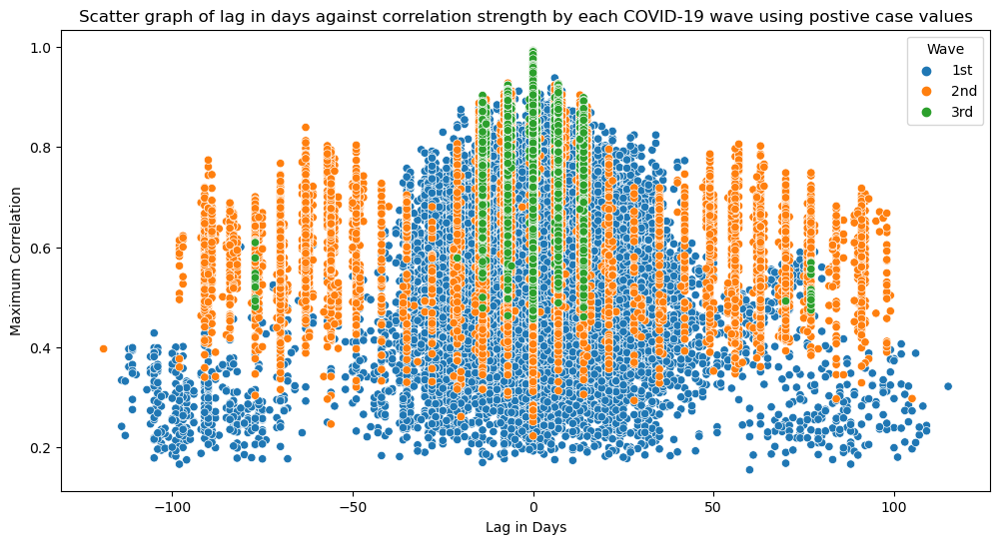

In [511]:
plt.figure(figsize=(12,6))

sns.scatterplot(data = all_waves, x = "Lag in Days", y = "Maximum Correlation", hue = 'Wave')
plt.title("Scatter graph of lag in days against correlation strength by each COVID-19 wave using postive case values")

plt.show()

In [534]:
all_waves_r = pd.concat([fwr_corrs, rsw_corrs, rtw_corrs])

In [536]:
all_waves_r['Wave'] = list(all_waves['Wave'])

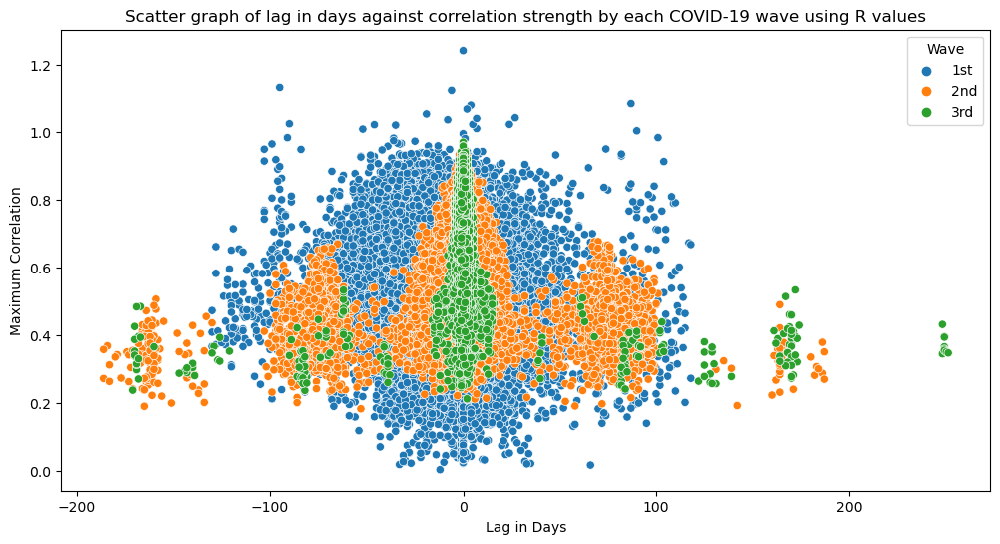

In [538]:
plt.figure(figsize=(12,6))

sns.scatterplot(data = all_waves_r, x = "Lag in Days", y = "Maximum Correlation", hue = 'Wave')
plt.title("Scatter graph of lag in days against correlation strength by each COVID-19 wave using R values")

plt.show()

In order to identify well connected LTLA's both correlation and lag needs to be considered. Two LTLA's with a high correlation but no lag time that are also far away in distance are not well connected, but are perhaps instead both well connected with an LTLA in between causing original two LTLA's to have high correlation at 0 lag time. 

Strong correlation will be taken as in the top 25% of correlations and lags will be investigated in the -21 to 21 day range.

In [540]:
fw_corrs.describe()

,Maximum Correlation,Lag in Days,Distance between centroids
count,49141.000000,49141.000000,49141.000000
mean,0.572271,0.092224,184.600849
std,0.126296,16.411315,104.591049
min,0.155391,-114.000000,2.246661
25%,0.492166,-7.000000,101.512899
50%,0.583774,0.000000,171.404568
75%,0.662128,7.000000,258.613252
max,0.937753,115.000000,568.808378


In [548]:
firstwave_lag = fw_corrs.loc[(fw_corrs['Maximum Correlation'] > 0.6621) & (fw_corrs['Lag in Days'] <= 21) & (fw_corrs['Lag in Days'] >= -21)]

In [549]:
firstwave_lag

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
9,Redcar and Cleveland,Hounslow,0.704785,-10.0,Urban-Rural,True,345.836353,1st
10,Redcar and Cleveland,Wandsworth,0.690571,-21.0,Urban-Rural,True,349.363988,1st
14,Redcar and Cleveland,Winchester,0.719156,-6.0,Rural-Rural,True,392.248522,1st
...,...,...,...,...,...,...,...,...
49122,County Durham,Basingstoke and Deane,0.726992,-7.0,Rural-Rural,True,383.162331,1st
49125,County Durham,Hillingdon,0.824759,-15.0,Urban-Rural,True,363.055895,1st
49131,Colchester,Basingstoke and Deane,0.679860,-21.0,Urban-Rural,True,157.684476,1st
49134,Colchester,Hillingdon,0.743909,-18.0,Urban-Urban,False,97.470539,1st


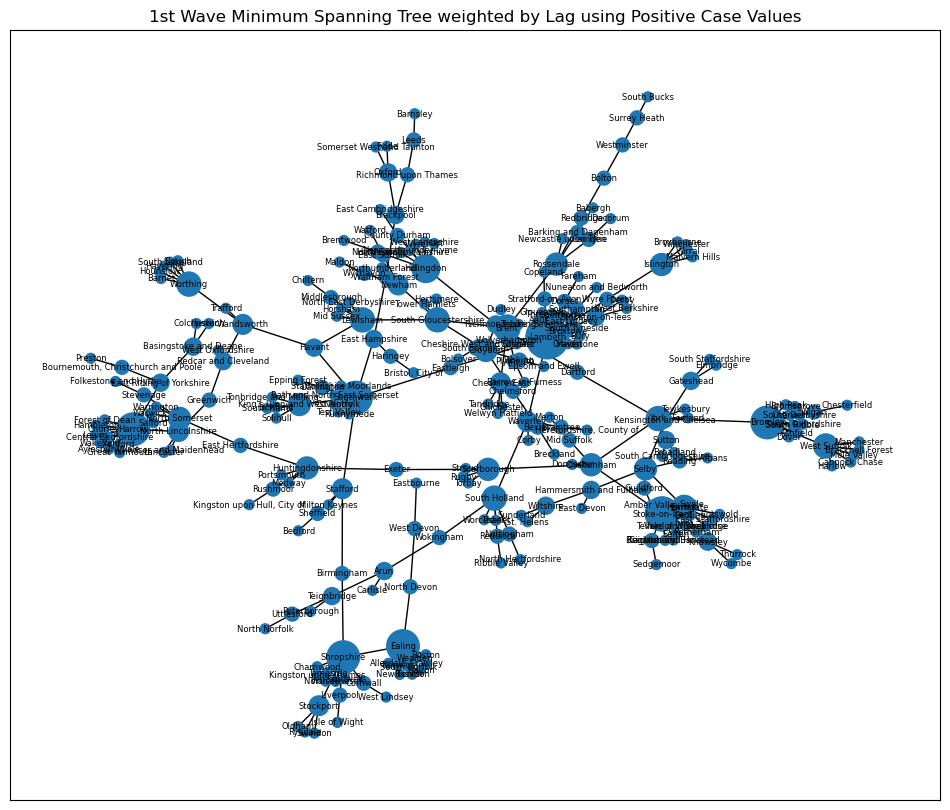

In [561]:
G = nx.from_pandas_edgelist(firstwave_lag,'LTLA 1','LTLA 2', edge_attr='Lag in Days')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Lag in Days')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Minimum Spanning Tree weighted by Lag using Positive Case Values')
plt.show()

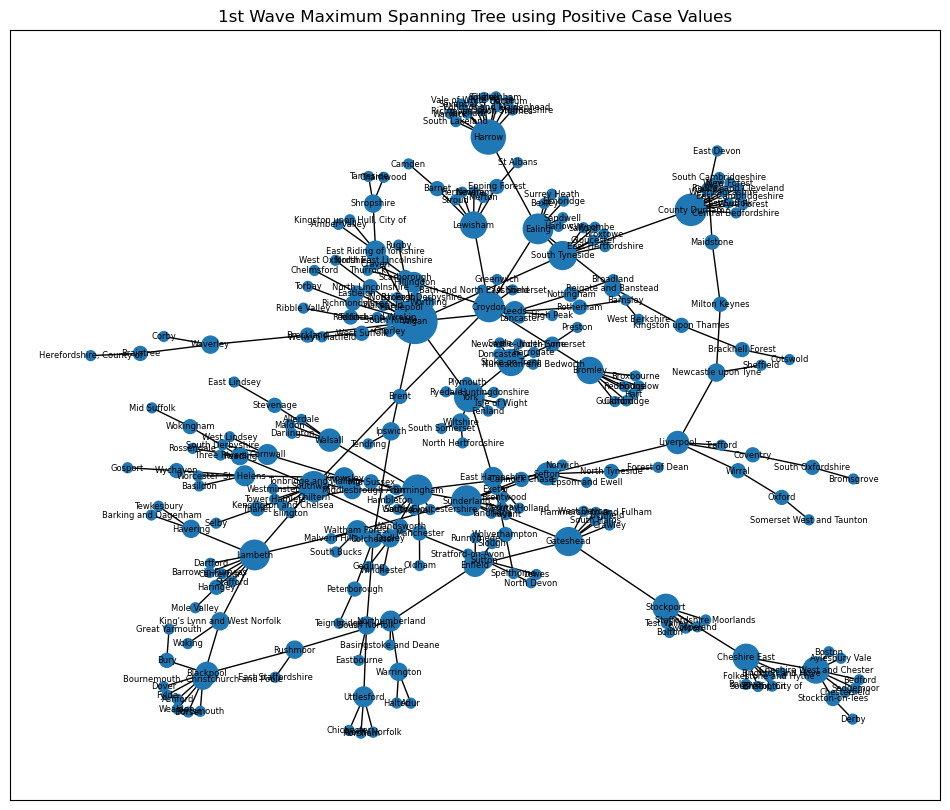

In [559]:
G = nx.from_pandas_edgelist(firstwave_lag,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Maximum Spanning Tree using Positive Case Values')
plt.show()

In [555]:
firstwave_lagtest = firstwave_lag.loc[((firstwave_lag['Lag in Days'] != 0) & (firstwave_lag['Distance between centroids'] > 100)) | ((firstwave_lag['Lag in Days'] == 0) & (firstwave_lag['Distance between centroids'] < 100)) ]

In [556]:
firstwave_lagtest

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
9,Redcar and Cleveland,Hounslow,0.704785,-10.0,Urban-Rural,True,345.836353,1st
10,Redcar and Cleveland,Wandsworth,0.690571,-21.0,Urban-Rural,True,349.363988,1st
14,Redcar and Cleveland,Winchester,0.719156,-6.0,Rural-Rural,True,392.248522,1st
...,...,...,...,...,...,...,...,...
49113,West Berkshire,County Durham,0.744296,5.0,Rural-Rural,True,362.909672,1st
49115,West Berkshire,Colchester,0.690818,4.0,Urban-Rural,True,156.923713,1st
49122,County Durham,Basingstoke and Deane,0.726992,-7.0,Rural-Rural,True,383.162331,1st
49125,County Durham,Hillingdon,0.824759,-15.0,Urban-Rural,True,363.055895,1st


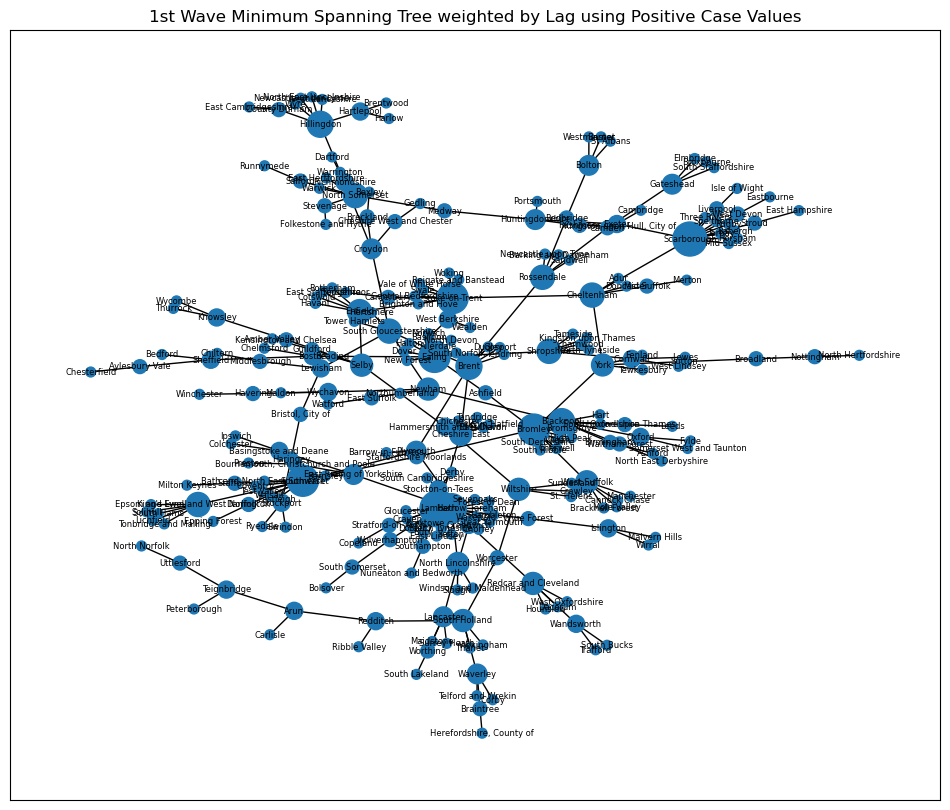

In [562]:
G = nx.from_pandas_edgelist(firstwave_lagtest,'LTLA 1','LTLA 2', edge_attr='Lag in Days')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#def normalize(values, bounds):
    #return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
#sizes = normalize2(degree_values,{'actual':{'lower':1,'upper':7},'desired':{'lower':10,'upper':150}})


# Find the minimum spanning tree
T = nx.minimum_spanning_tree(G, weight = 'Lag in Days')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 50 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Minimum Spanning Tree weighted by Lag using Positive Case Values')
plt.show()